<a href="https://colab.research.google.com/github/Roshan-Kaveri/pediatric-respiratory-prediction/blob/main/Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install scikit-learn


In [ ]:


import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor, BaggingClassifier,AdaBoostClassifier,GradientBoostingClassifier
from sklearn.linear_model import LinearRegression,LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from collections import Counter
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import TomekLinks
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline


from sklearn.metrics import hamming_loss
from sklearn.metrics import jaccard_score
from sklearn.metrics import log_loss
from sklearn.metrics import matthews_corrcoef


from sklearn.ensemble import VotingClassifier
from google.colab import files
uploaded = files.upload()

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 238.4/238.4 kB 5.2 MB/s eta 0:00:00


Saving BD_Final.csv to BD_Final.csv


In [ ]:
import io
df =pd.read_csv(io.BytesIO(uploaded['BD_Final.csv']))

In [ ]:
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows',None)

In [ ]:
df = df.apply(pd.to_numeric, errors='coerce')

In [ ]:
df.shape  # number of columns and rows


(801, 87)

In [ ]:
df = df.sample(frac = 1)  # Shuffle rows
df.isna().sum()  # checking for null values


,0
Age (months),0
Gender,0
Medical insurance,4
Length of stay (Days),0
Meets criteria for clinical pneumonia,0
Number of persons living in house,2
Number of siblings,2
Number of rooms in house,4
Smokers at home,1
Contact with a tuberculosis patient,1


In [ ]:
df = df.fillna(df.median())
df.isna().sum()

,0
Age (months),0
Gender,0
Medical insurance,0
Length of stay (Days),0
Meets criteria for clinical pneumonia,0
Number of persons living in house,0
Number of siblings,0
Number of rooms in house,0
Smokers at home,0
Contact with a tuberculosis patient,0


In [ ]:
# copy the data
df_max_scaled = df.copy()

# apply normalization techniques
for column in df_max_scaled.columns:
    df_max_scaled[column] = df_max_scaled[column]  / df_max_scaled[column].abs().max()

# view normalized data
display(df_max_scaled)

,Age (months),Gender,Medical insurance,Length of stay (Days),Meets criteria for clinical pneumonia,Number of persons living in house,Number of siblings,Number of rooms in house,Smokers at home,Contact with a tuberculosis patient,Health history : Prior admission because of respiratory condition,Health history : Prematurity,Breastfeeding,Number of Hib vaccine doses received,Number of pneumococcal vaccine doses received,Number of antirotavirus vaccine doses received,Vitamin A supplementation,Previous history of antibiotic use in the 2 weeks leading up to the admission,If yes. which antibiotics,If yes. who prescribed the antibiotics,Known asthmatic patient,Patient with a diagnosed chronic condition,Duration of pain before consultation (days),History of fever,Number of days with fever,History of vomiting,Number of days of vomiting,History of diarrhea,History of cough,History of rhinorrhea,Weight (Kg),Height (cm),Unusual sleepiness,Oxygen saturation (SaO2) at admission,Axillary temperature (Â°C),Respiratory rate,Heart rate,Paleness,Disorders of consciousness,Dehydration signs,Confirmation of dehydration,Restlessness,Cyanosis,Nasal flaring,Laryngeal stridor,Rhonchi,Crackles,Wheezing,Hypoventilation,Nasopharyngeal aspiration,Labored breathing,Wood Downes score,Score interpretation,Blood sugar level,Natremia,Kaliemia,Creatinine Blood Test,Urea,C-reactive protein,Procalcitonin,Oxygen Therapy,Bronchodilators,Corticosteroid,Antibiotherapy during hospitalization,Cloxacillin,Gentamicin,Ampicillin,Cephalosporin,Amoxicillin/Clavulanic acid,Chloramphenicol,Patient transferred to intensive care unit,Length of stay in intensive care unit,Chest X-ray finding,Pleural effusion,Location of pleural effusion,Main diagnostic,HIV testing,HIV test results,Blood culture results,Nasopharyngeal aspirate culture (NPA) Identification 1,Nasopharyngeal aspirate culture (NPA) Identification 2,Detection of DNA/RNA (TrueScience Respifinder Pathogen Identification Panel) Allele 1,Detection of DNA/RNA (TrueScience Respifinder Pathogen Identification Panel) Allele 2,Detection of DNA/RNA (TrueScience Respifinder Pathogen Identification Panel) Allele 3,Detection of DNA/RNA (TrueScience Respifinder Pathogen Identification Panel) Allele 4,Detection of DNA/RNA (TrueScience Respifinder Pathogen Identification Panel) Allele 5,Clinical progression
775,0.217949,0.0,0.0,0.021021,1.0,0.388889,0.250,0.428571,0.0,0.0,0.0,0.0,1.0,1.000000,0.00,0.000000,1.0,0.0,0.190476,0.5,0.0,0.0,0.033333,1.0,0.066667,1.0,0.032258,0.0,1.0,1.0,0.500000,0.808333,1.0,0.93,0.904762,0.225641,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.5,0.538462,0.5,0.273810,0.333333,0.681159,0.159533,0.080972,0.363636,0.000648,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.275000,0.666667,0.0,0.5,0.088235,0.0,0.0,0.50,0.181818,0.8,0.533333,0.571429,0.538462,0.4,0.571429,0.0
246,0.346154,1.0,0.0,0.006006,1.0,0.166667,0.250,0.571429,1.0,0.0,0.0,0.0,1.0,1.000000,0.00,0.000000,1.0,0.0,0.190476,0.5,0.0,0.0,0.033333,1.0,0.066667,0.0,0.032258,0.0,1.0,1.0,0.416667,0.658333,0.0,0.97,0.904762,0.235897,0.684211,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.5,0.538462,0.5,0.273810,0.333333,0.681159,0.159533,0.080972,0.127273,0.000378,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.666667,0.0,0.5,0.029412,0.0,0.0,0.50,0.181818,0.8,0.600000,0.000000,0.538462,0.4,0.571429,0.0
362,0.371795,0.0,0.0,0.000000,1.0,0.444444,0.125,0.428571,1.0,0.0,0.0,1.0,0.0,1.000000,0.00,0.000000,1.0,0.0,0.190476,0.5,0.0,0.0,0.016667,1.0,0.066667,0.0,0.032258,1.0,1.0,1.0,0.541667,0.750000,1.0,0.94,0.928571,0.317949,0.673684,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.5,0.692308,1.0,0.273810,0.333333,0.681159,0.159533,0.080972,0.000000,0.000378,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.666667,0.0,0.5,0.029412,0.0,0.0,0.50,0.636364,0.8,0.133333,0.571429,0.538462,0.4,0.571429,0.0
532,0.269231,1.0,0.0,0.003003,1.0,0.277778,0.375,0.142857,0.0,0.0,0.0,0.0,1.0,1.000000,0.50,0.333333,1.0,1.0,0.190476,0.5,0

In [ ]:
#df=df_max_scaled

In [ ]:
df['Clinical progression'].value_counts()

,count
Clinical progression,
0,771
1,30


In [ ]:
from imblearn.over_sampling import BorderlineSMOTE
df = df.astype('float64')

x = df.drop('Clinical progression', axis=1)
y = df['Clinical progression'].astype('int')



x_train,x_test,y_train,y_test = train_test_split(x,y, test_size = 0.2, random_state = 1)

oversample = BorderlineSMOTE()
x_train, y_train = oversample.fit_resample(x_train, y_train)


In [ ]:
y_train.value_counts()

,count
Clinical progression,
0,617
1,617


In [ ]:
# #Pearsons Co-relation
# df = df.astype('float64')
# import seaborn as sns
# corr=df.corr()
# plt.figure(figsize=(30,10))
# sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns, cmap=sns.color_palette('RdBu_r'),
#             annot=True)
# plt.savefig("Pearson.png",dpi=600,bbox_inches = 'tight')
# plt.show()

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer
from sklearn.model_selection import RandomizedSearchCV
rf = RandomForestClassifier()


param_grid = {
    'bootstrap': [True],
    'max_depth': [80, 90, 100, 110],
    'max_features': [2, 3],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [100, 200, 300, 1000]
}

rfclassifier = RandomizedSearchCV(
    rf, param_distributions=param_grid, n_iter=10,
    cv=5, n_jobs=-1, random_state=42
)
rfclassifier.fit(x_train, y_train)
rfclassifier.best_params_

{'n_estimators': 200,
 'min_samples_split': 10,
 'min_samples_leaf': 3,
 'max_features': 2,
 'max_depth': 90,
 'bootstrap': True}

In [ ]:
x_test.head()

,Age (months),Gender,Medical insurance,Length of stay (Days),Meets criteria for clinical pneumonia,Number of persons living in house,Number of siblings,Number of rooms in house,Smokers at home,Contact with a tuberculosis patient,Health history : Prior admission because of respiratory condition,Health history : Prematurity,Breastfeeding,Number of Hib vaccine doses received,Number of pneumococcal vaccine doses received,Number of antirotavirus vaccine doses received,Vitamin A supplementation,Previous history of antibiotic use in the 2 weeks leading up to the admission,If yes. which antibiotics,If yes. who prescribed the antibiotics,Known asthmatic patient,Patient with a diagnosed chronic condition,Duration of pain before consultation (days),History of fever,Number of days with fever,History of vomiting,Number of days of vomiting,History of diarrhea,History of cough,History of rhinorrhea,Weight (Kg),Height (cm),Unusual sleepiness,Oxygen saturation (SaO2) at admission,Axillary temperature (Â°C),Respiratory rate,Heart rate,Paleness,Disorders of consciousness,Dehydration signs,Confirmation of dehydration,Restlessness,Cyanosis,Nasal flaring,Laryngeal stridor,Rhonchi,Crackles,Wheezing,Hypoventilation,Nasopharyngeal aspiration,Labored breathing,Wood Downes score,Score interpretation,Blood sugar level,Natremia,Kaliemia,Creatinine Blood Test,Urea,C-reactive protein,Procalcitonin,Oxygen Therapy,Bronchodilators,Corticosteroid,Antibiotherapy during hospitalization,Cloxacillin,Gentamicin,Ampicillin,Cephalosporin,Amoxicillin/Clavulanic acid,Chloramphenicol,Patient transferred to intensive care unit,Length of stay in intensive care unit,Chest X-ray finding,Pleural effusion,Location of pleural effusion,Main diagnostic,HIV testing,HIV test results,Blood culture results,Nasopharyngeal aspirate culture (NPA) Identification 1,Nasopharyngeal aspirate culture (NPA) Identification 2,Detection of DNA/RNA (TrueScience Respifinder Pathogen Identification Panel) Allele 1,Detection of DNA/RNA (TrueScience Respifinder Pathogen Identification Panel) Allele 2,Detection of DNA/RNA (TrueScience Respifinder Pathogen Identification Panel) Allele 3,Detection of DNA/RNA (TrueScience Respifinder Pathogen Identification Panel) Allele 4,Detection of DNA/RNA (TrueScience Respifinder Pathogen Identification Panel) Allele 5
415,38.0,1.0,0.0,2.0,1.0,7.0,5.0,3.0,0.0,0.0,1.0,0.0,0.0,3.0,0.0,0.0,1.0,0.0,4.0,1.0,1.0,0.0,3.0,0.0,2.0,1.0,1.0,0.0,1.0,1.0,16.0,100.0,1.0,99.0,37.2,62.0,114.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,7.0,1.0,0.92,136.0,4.7,4.1,0.20,9.0,0.05,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,1.0,1.0,0.0,0.0,10.0,10.0,4.0,8.0,8.0,7.0,4.0,4.0
499,4.0,1.0,0.0,2.0,0.0,8.0,1.0,4.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,4.0,1.0,0.0,0.0,5.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,4.0,60.0,1.0,96.0,37.2,50.0,110.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,7.0,1.0,0.94,138.0,5.2,4.2,0.12,43.0,0.15,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,1.0,23.0,0.0,0.0,10.0,2.0,4.0,8.0,8.0,7.0,4.0,4.0
628,10.0,1.0,1.0,2.0,0.0,7.0,5.0,1.0,0.0,0.0,0.0,0.0,1.0,3.0,0.0,0.0,1.0,0.0,4.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,8.0,83.0,1.0,98.0,37.2,28.0,90.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,2.0,0.0,0.92,136.0,4.7,4.1,0.20,1.0,0.18,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,18.0,0.0,0.0,10.0,9.0,4.0,8.0,12.0,7.0,4.0,4.0
346,49.0,0.0,0.0,7.0,1.0,8.0,3.0,3.0,1.0,0.0,1.0,0.0,1.0,3.0,0.0,0.0,1.0,0.0,4.0,1.0,1.0,0.0,2.0,1.0,1.0,0.0,2.0,0.0,1.0,1.0,15.0,102.0,0.0,96.0,37.6,68.0,110.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,8.0,2.0,0.92,136.0,4.7,4.1,0.20,14.0,0.05,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,1.0,1.0,0.0,0.0,10.0,2.0,4.0,0.0,8.0,7.0,4.0,4.0
697,11.0,0.0,0.0,6.0,1.0,3.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,3.0,0.0,0.0,1.0,1.0,4.0,1.0,1.0,0.0,2.0,1.0,2.0,1.0,2.0,0.0,1.0,0.0,8.0,68.0,1.0,96.0,37.7,60.0,129.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,9.0,2.0,0.92,

In [ ]:
from sklearn.metrics import roc_auc_score, roc_curve, confusion_matrix, precision_score, recall_score
from sklearn.metrics import classification_report, average_precision_score, accuracy_score, f1_score
# x_test = imputer.transform(x_test)

y_pred = rfclassifier.predict(x_test)
y_proba = rfclassifier.predict_proba(x_test)[:, 1]

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[154   0]
 [  5   2]]
              precision    recall  f1-score   support

           0       0.97      1.00      0.98       154
           1       1.00      0.29      0.44         7

    accuracy                           0.97       161
   macro avg       0.98      0.64      0.71       161
weighted avg       0.97      0.97      0.96       161





accuracy 0.97
precision 0.97
recall 0.97
f1-score 0.961
AUC: 0.87
Precision-Recall: 0.59
hamming loss
0.031055900621118012
jaccord score
0.2857142857142857
log loss
1.1193681176744459
mathews correlation coefficient
0.5260509098446914


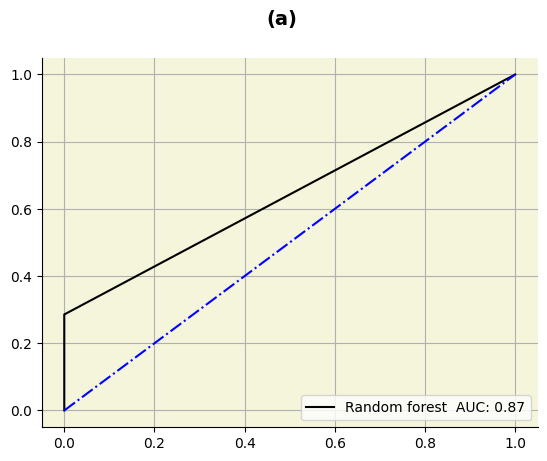

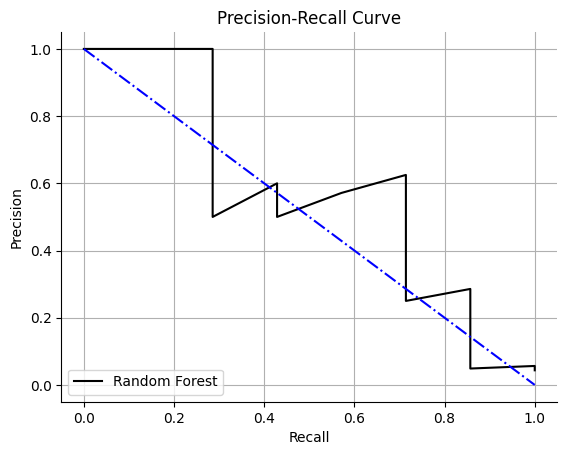

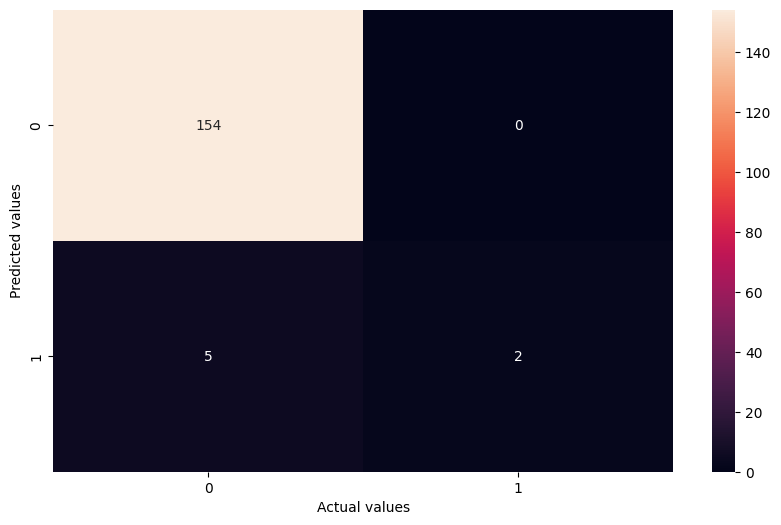

In [ ]:
# RandomForest summary
print('\n')
accuracy = round(accuracy_score(y_test, y_pred),2)
print("accuracy",accuracy)
precision = round(precision_score(y_test, y_pred, average='weighted'),2)
print("precision",precision)
recall = round(recall_score(y_test, y_pred, average='weighted'),2)
print("recall",recall)

f1 = round(f1_score(y_test, y_pred, average='weighted'),3)
print("f1-score",f1)

# precision_recall = round(average_precision_score(y_test, y_proba, average='weighted'),2)
auc = round(roc_auc_score(y_test, y_proba, average='weighted', multi_class='ovr'), 2)
print('AUC: {}'.format(round(roc_auc_score(y_test, y_proba),2)))
print('Precision-Recall: {}'.format(round(average_precision_score(y_test, y_proba),2)))

fpr, tpr, _ = roc_curve(y_test,  y_pred)
auc = round(roc_auc_score(y_test, y_proba),2)


print("hamming loss")
print(hamming_loss(y_test, y_pred))
print("jaccord score")
print(jaccard_score(y_test, y_pred))
print("log loss")
print(log_loss(y_test,y_pred))
print("mathews correlation coefficient")
print(matthews_corrcoef(y_test, y_pred))


fig = plt.figure()

# Set titles for the figure and the subplot respectively
fig.suptitle('(a)', fontsize=14, fontweight='bold')
ax = plt.axes()
ax.set_facecolor('beige')

plt.plot(fpr,tpr,color='xkcd:black',label='Random forest  AUC: '+str(auc))
plt.legend(loc=4)
plt.grid(True)
plt.plot([0, 1], [0, 1], color='blue', linestyle='-.')
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.savefig("AUC RandomForest", dpi=800,bbox_inches = 'tight')

plt.show()




#Precsiion Recall Curve
from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt

# Assuming rfclassifier is already trained
y_scores = rfclassifier.predict_proba(x_test)[:, 1]
precision, recall, _ = precision_recall_curve(y_test, y_scores)

plt.plot(recall, precision, color='xkcd:black', label='Random Forest')
plt.plot([0, 1], [1, 0], color='blue', linestyle='-.')
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.legend(loc='lower left')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.grid(True)

plt.savefig("PR_curve_random_forest.png", dpi=800, bbox_inches='tight')
plt.show()


#Confusion Matrix
 #print confusion matrix
cm=confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10,6))
sns.heatmap(cm,annot=True,fmt="d")
sns.heatmap
plt.xlabel('Actual values')
plt.ylabel('Predicted values')
plt.savefig("Confusion Matix Random forest", dpi=800,bbox_inches = 'tight')

Select K Best

In [ ]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif


scaler = MinMaxScaler()

scaled_X_train_v1 = scaler.fit_transform(x_train)

scaled_df = pd.DataFrame(scaled_X_train_v1, columns=x_train.columns)

# Selecting the top 15 features using SelectKBest
selector = SelectKBest(score_func=mutual_info_classif, k=15)
selected_X_train = selector.fit_transform(scaled_X_train_v1, y_train)

# Get the scores and p-values
scores = selector.scores_
p_values = selector.pvalues_

# Creating a DataFrame with feature scores and p-values
feature_scores = pd.DataFrame({
    'Feature': x_train.columns,
    'Score': scores,
    'P-Value': p_values
})

# Sorting features by score
feature_scores = feature_scores.sort_values(by='Score', ascending=False)

# Selecting top 15 features
top_15_features = feature_scores.head(15)

# Printing the top 15 features
print(top_15_features)


                                        Feature     Score P-Value
71        Length of stay in intensive care unit  0.610056    None
70   Patient transferred to intensive care unit  0.566327    None
56                        Creatinine Blood Test  0.535990    None
75                              Main diagnostic  0.515902    None
57                                         Urea  0.512942    None
53                            Blood sugar level  0.504563    None
55                                     Kaliemia  0.502971    None
54                                     Natremia  0.485842    None
34                   Axillary temperature (Â°C)  0.478724    None
31                                  Height (cm)  0.471890    None
22  Duration of pain before consultation (days)  0.465374    None
33        Oxygen saturation (SaO2) at admission  0.455138    None
6                            Number of siblings  0.448058    None
0                                  Age (months)  0.443569    None
3         

In [ ]:
top_15_feature_names = top_15_features['Feature'].values

x_train_top_15 = x_train[top_15_feature_names]

rf = RandomForestClassifier()

param_grid = {
    'bootstrap': [True],
    'max_depth': [80, 90, 100, 110],
    'max_features': [2, 3],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [100, 200, 300, 1000]
}

rfclassifier = RandomizedSearchCV(
    rf, param_distributions=param_grid, n_iter=10,
    cv=5, n_jobs=-1, random_state=42
)

rfclassifier.fit(x_train_top_15, y_train)

best_params = rfclassifier.best_params_

# Printing the best parameters
print("Best Parameters:", best_params)

Best Parameters: {'n_estimators': 200, 'min_samples_split': 12, 'min_samples_leaf': 3, 'max_features': 2, 'max_depth': 80, 'bootstrap': True}


Confusion Matrix:
[[154   0]
 [  7   0]]

Classification Report:
              precision    recall  f1-score   support

           0       0.96      1.00      0.98       154
           1       0.00      0.00      0.00         7

    accuracy                           0.96       161
   macro avg       0.48      0.50      0.49       161
weighted avg       0.91      0.96      0.94       161


ROC AUC Score: 0.8432282003710576
Precision: 0.0
Recall: 0.0
Average Precision Score: 0.32562600797894914
Accuracy: 0.9565217391304348
F1 Score: 0.0


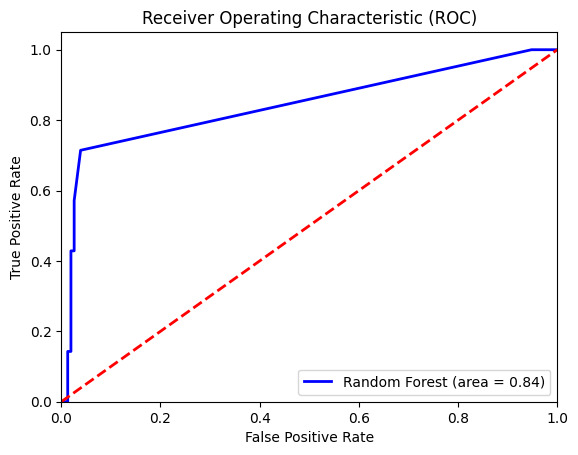

In [ ]:
from sklearn.metrics import roc_auc_score, roc_curve, confusion_matrix, precision_score, recall_score
from sklearn.metrics import classification_report, average_precision_score, accuracy_score, f1_score

# Assuming x_test and y_test are already defined

# Scaling the test set
scaled_X_test_v1 = scaler.transform(x_test)

# Selecting only the top 15 features from the scaled test set
x_test_top_15 = pd.DataFrame(scaled_X_test_v1, columns=x_train.columns)[top_15_feature_names]

# Making predictions on the test set
y_pred = rfclassifier.predict(x_test_top_15)
y_proba = rfclassifier.predict_proba(x_test_top_15)[:, 1]

# Printing the confusion matrix
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

# Printing the classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Calculating additional metrics
roc_auc = roc_auc_score(y_test, y_proba)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
average_precision = average_precision_score(y_test, y_proba)
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Printing additional metrics
print("\nROC AUC Score:", roc_auc)
print("Precision:", precision)
print("Recall:", recall)
print("Average Precision Score:", average_precision)
print("Accuracy:", accuracy)
print("F1 Score:", f1)

# Plotting the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_proba)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='Random Forest (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

\Select From Model Method

In [ ]:
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.feature_selection import SelectFromModel
# rf = RandomForestClassifier()

# # Fit the Random Forest on the training data to determine feature importance
# rf.fit(x_train, y_train)
# # Select features based on importance
# feature_selector = SelectFromModel(rf, threshold=-np.inf, max_features=15)
# x_train_selected = feature_selector.fit_transform(x_train, y_train)
# x_test_selected = feature_selector.transform(x_test)
# param_grid = {
#     'bootstrap': [True],
#     'max_depth': [80, 90, 100, 110],
#     'max_features': [2, 3],
#     'min_samples_leaf': [3, 4, 5],
#     'min_samples_split': [8, 10, 12],
#     'n_estimators': [100, 200, 300, 1000]
# }

# rfclassifier = RandomizedSearchCV(
#     rf, param_distributions=param_grid, n_iter=10,
#     cv=5, n_jobs=-1, random_state=42
# )
# rfclassifier.fit(x_train, y_train)
# rfclassifier.best_params_


# from sklearn.metrics import roc_auc_score, roc_curve, confusion_matrix, precision_score, recall_score
# from sklearn.metrics import classification_report, average_precision_score, accuracy_score, f1_score
# y_pred = rfclassifier.predict(x_test)
# y_proba = rfclassifier.predict_proba(x_test)[:,1]

# print(confusion_matrix(y_test, y_pred))
# print(classification_report(y_test, y_pred))
# print(f"Number of selected features: {x_train_selected.shape[1]}")

# # Print the names or indices of selected features
# selected_features_indices = feature_selector.get_support(indices=True)
# selected_feature_names = [x_train.columns[i] for i in selected_features_indices]  # Assuming x_train is a DataFrame

# print("Selected Features:")
# for feature_name in selected_feature_names:
#     print(feature_name)

In [ ]:
!pip install shap

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 15.9 MB/s eta 0:00:00


In [ ]:
import shap
explainer = shap.Explainer(rfclassifier.predict, x_train_top_15)
shap_values = explainer(x_train_top_15)

PermutationExplainer explainer: 1235it [09:21,  2.18it/s]


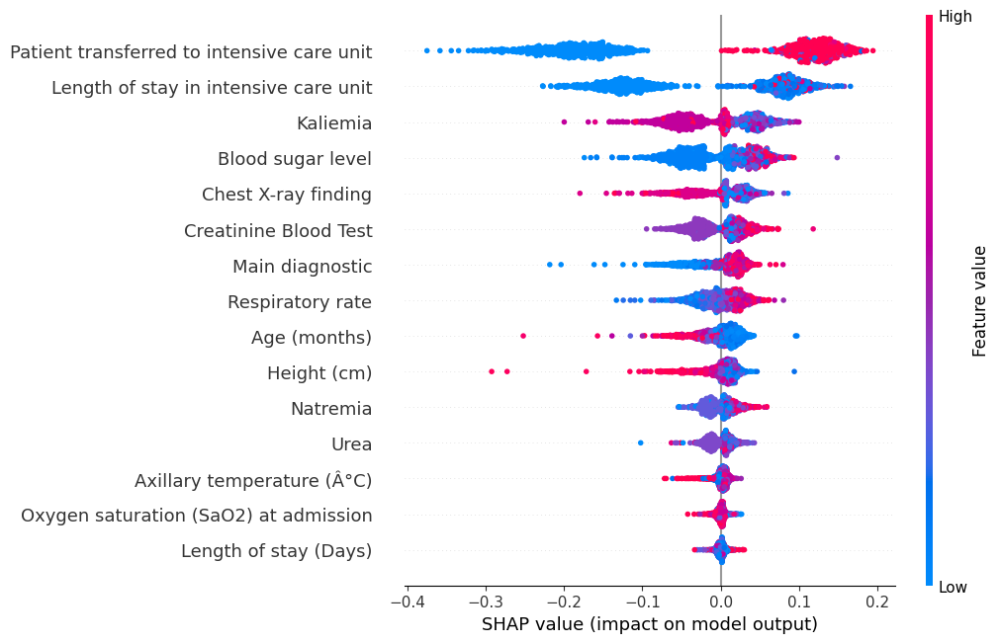

In [ ]:
fig=plt.figure()
fig=shap.plots.beeswarm(shap_values, max_display=25,show=False)
plt.savefig("BeeSwarm1.png", dpi=700,bbox_inches = 'tight')
plt.show()

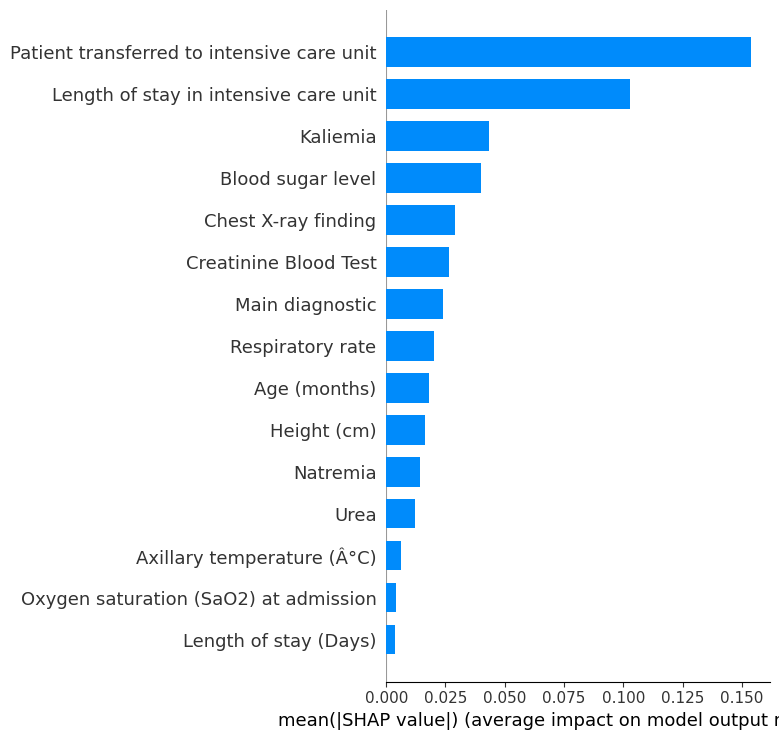

In [ ]:
fig=shap.summary_plot(shap_values, x_train_top_15, plot_type="bar",show=False)
plt.savefig("BarChartSHAP.png", dpi=100,bbox_inches = 'tight')
plt.show()

In [ ]:
!pip install eli5

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 kB 4.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107721 sha256=8f9cef01fb949b873f5487bd3a50667fd11dd3480d3859e18ea6d5e33ca3650a
  Stored in directory: /root/.cache/pip/wheels/b8/58/ef/2cf4c306898c2338d51540e0922c8e0d6028e07007085c0004
Successfully built eli5


In [ ]:
#ELI5
import eli5 as eli
eli.explain_weights(rfclassifier.best_estimator_)

Weight,Feature
0.2258 ± 0.5407,x0
0.1028 ± 0.3510,x3
0.0953 ± 0.2961,x12
0.0696 ± 0.2175,x1
0.0684 ± 0.2032,x5
0.0651 ± 0.2474,x2
0.0637 ± 0.2622,x6
0.0635 ± 0.2584,x8
0.0548 ± 0.2453,x4
0.0475 ± 0.1935,x10


In [ ]:
eli.show_weights(rfclassifier.best_estimator_)

Weight,Feature
0.2258 ± 0.5407,x0
0.1028 ± 0.3510,x3
0.0953 ± 0.2961,x12
0.0696 ± 0.2175,x1
0.0684 ± 0.2032,x5
0.0651 ± 0.2474,x2
0.0637 ± 0.2622,x6
0.0635 ± 0.2584,x8
0.0548 ± 0.2453,x4
0.0475 ± 0.1935,x10


In [ ]:
eli.show_prediction(rfclassifier.best_estimator_,x_test_top_15.iloc[1],
                    feature_names=list(x_train_top_15.columns),
                    show_feature_values=True)

# **Lime**

In [ ]:
!pip install lime

In [ ]:
import lime
from lime import lime_tabular

interpretor = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train_top_15),
    feature_names=x_train_top_15.columns,
    mode='classification'
)

In [ ]:
!pip install --upgrade scikit-learn
!pip install --upgrade scipy



In [ ]:
exp = interpretor.explain_instance(
    data_row=x_test_top_15.iloc[12], ##new data
    predict_fn=rfclassifier.predict_proba
)
exp.save_to_file('LIME1.html')

fig = exp.as_pyplot_figure()
fig.savefig('lime_report.png')

fig=exp.show_in_notebook(show_table=True)
plt.savefig("LIMESurvived.png", dpi=100,bbox_inches = 'tight')
plt.show()

TypeError: solve() got an unexpected keyword argument 'sym_pos'

In [ ]:
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()

    plt.savefig("LIME1.png", dpi=600,bbox_inches = 'tight')

In [ ]:
exp = interpretor.explain_instance(
    data_row=x_test_top_15.iloc[25], ##new data
    predict_fn=rfclassifier.predict_proba
)

fig=exp.show_in_notebook(show_table=True)

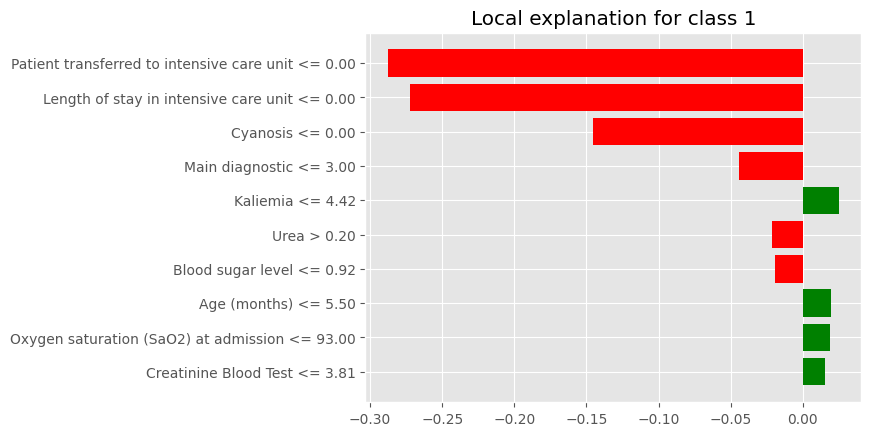

In [ ]:
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()
    plt.savefig("LIME2.png", dpi=600,bbox_inches = 'tight')

# **feyn**

In [ ]:
!pip install feyn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 326.2/326.2 kB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 111.0/111.0 kB 8.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 856.7/856.7 kB 28.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.1/67.1 kB 5.1 MB/s eta 0:00:00


In [ ]:
import feyn

# Create a new QLattice instance
ql = feyn.QLattice(random_seed=42)




# Rename columns to remove colons and spaces
df.columns = [col.replace(':', '').replace(' ', '_') for col in df.columns]

# Run the auto_run function
fig = ql.auto_run(df, output_name="Clinical_progression", kind="classification", max_complexity=5)




<?xml version="1.0" encoding="utf-8" ?>
<svg baseProfile="full" height="216.0" preserveAspectRatio="none" version="1.1" viewBox="0 0 651 216.0" width="651" xmlns="http://www.w3.org/2000/svg" xmlns:ev="http://www.w3.org/2001/xml-events" xmlns:xlink="http://www.w3.org/1999/xlink"><defs /><svg class="graph" height="155.0" width="471" x="0" y="0"><defs /><rect class="node" fill="#00F082" height="35" stroke="#1E1E1E" stroke-width="1" width="90" x="361" y="50.0"><title>Clinical_progression
logistic:
w=-1.4885
bias=-2.0488</title></rect><text fill="#1E1E1E" font-family="monospace" font-size="12" style="pointer-events:none" text-anchor="middle" x="406.0" y="71.5">Clinical..</text><text fill="#1E1E1E" font-family="monospace" font-size="10" style="pointer-events:none" text-anchor="end" x="449" y="59.0">0</text><text fill="#1E1E1E" font-family="monospace" font-size="10" style="pointer-events:none" text-anchor="start" x="363" y="59.0">logistic</text><line stroke="#1E1E1E" x1="331" x2="361" y1="67.5" y2="67.5" /><rect class="node" fill="#FAFAFA" height="35" stroke="#FF1EC8" stroke-width="1" width="90" x="241" y="50.0"><title>add</title></rect><text fill="#1E1E1E" font-family="monospace" font-size="12" style="pointer-events:none" text-anchor="middle" x="286.0" y="71.5">add</text><text fill="#1E1E1E" font-family="monospace" font-size="10" style="pointer-events:none" text-anchor="end" x="329" y="59.0">1</text><line stroke="#1E1E1E" x1="211" x2="241" y1="37.5" y2="58.5" /><line stroke="#1E1E1E" x1="211" x2="241" y1="97.5" y2="76.5" /><rect class="node" fill="#FAFAFA" height="35" stroke="#FF1EC8" stroke-width="1" width="90" x="121" y="20.0"><title>exp</title></rect><text fill="#1E1E1E" font-family="monospace" font-size="12" style="pointer-events:none" text-anchor="middle" x="166.0" y="41.5">exp</text><text fill="#1E1E1E" font-family="monospace" font-size="10" style="pointer-events:none" text-anchor="end" x="209" y="29.0">2</text><line stroke="#1E1E1E" x1="91" x2="121" y1="67.5" y2="37.5" /><rect class="node" fill="#00F082" height="35" stroke="#1E1E1E" stroke-width="1" width="90" x="1" y="50.0"><title>Weight_(Kg)
linear:
scale=0.094787
scale offset=11.052185
w=0.816080
bias=1.1995</title></rect><text fill="#1E1E1E" font-family="monospace" font-size="12" style="pointer-events:none" text-anchor="middle" x="46.0" y="71.5">Weight_(..</text><text fill="#1E1E1E" font-family="monospace" font-size="10" style="pointer-events:none" text-anchor="end" x="89" y="59.0">3</text><text fill="#1E1E1E" font-family="monospace" font-size="10" style="pointer-events:none" text-anchor="start" x="3" y="59.0">num</text><rect class="node" fill="#00F082" height="35" stroke="#1E1E1E" stroke-width="1" width="90" x="121" y="80.0"><title>Patient_transferred_to_intensive_care_unit
linear:
scale=2.000000
scale offset=0.081149
w=-1.398386
bias=-1.2288</title></rect><text fill="#1E1E1E" font-family="monospace" font-size="12" style="pointer-events:none" text-anchor="middle" x="166.0" y="101.5">Patient_..</text><text fill="#1E1E1E" font-family="monospace" font-size="10" style="pointer-events:none" text-anchor="end" x="209" y="89.0">4</text><text fill="#1E1E1E" font-family="monospace" font-size="10" style="pointer-events:none" text-anchor="start" x="123" y="89.0">num</text></svg><svg class="summary" height="79" width="180" x="471" y="0"><defs /><text fill="#1E1E1E" font-family="monospace" font-size="14" text-anchor="start" x="0" y="14">Training Metrics</text><line stroke="#1E1E1E" x1="0" x2="160" y1="19" y2="19" /><text fill="#1E1E1E" font-family="monospace" font-size="14" text-anchor="start" x="5" y="34">Accuracy</text><text fill="#1E1E1E" font-family="monospace" font-size="14" text-anchor="end" x="155" y="34">0.971</text><text fill="#1E1E1E" font-family="monospace" font-size="14" text-anchor="start" x="5" y="49">AUC</text><text fill="#1E1E1E" font-family="monospace" font-size="14" text-anchor="end" x="155" y="49">0.947</text><text fill="#1E1E1E" font-family="monospace" font-size="1
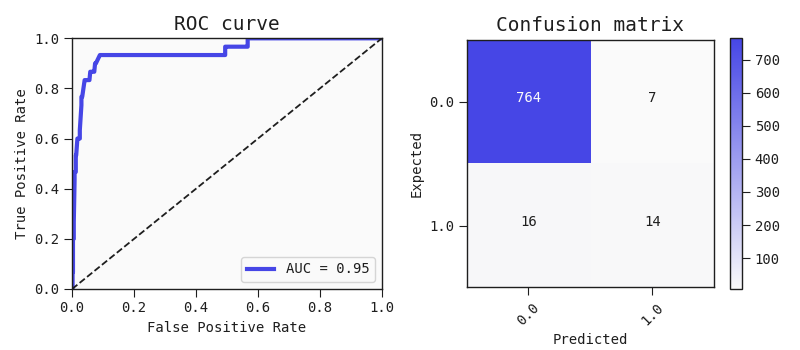

In [ ]:
# Select the best model
best_model = fig[0]
best_model1 = fig[1]
best_model2 = fig[2]
best_model3 = fig[3]

# Plot the best model to see the tree structure
best_model.plot(df)
best_model1.plot(df)
best_model2.plot(df)
best_model3.plot(df)


Anchor

In [ ]:
!pip install anchor


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.3/126.3 kB 7.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Using cached pbr-6.1.0-py2.py3-none-any.whl.metadata (3.4 kB)
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 432.2/432.2 kB 25.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 70.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.1/132.1 kB 10.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 260.1/260.1 kB 19.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.5/129.5 kB 9.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 146.1/146.1 kB 9.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.7/49.7 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 8.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 289.3/289.3 kB 19.1 MB/s eta 0:00:00
   ━━━━━━━━━

In [ ]:
!pip install alibi

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 522.1/522.1 kB 16.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.8/60.8 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.4/119.4 kB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.7/14.7 MB 51.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.5/98.5 MB 7.4 MB/s eta 0:00:00
  Attempting uninstall: attrs
    Found existing installation: attrs 24.2.0
    Uninstalling attrs-24.2.0:
      Successfully uninstalled attrs-24.2.0
  Attempting uninstall: scikit-image
    Found existing installation: scikit-image 0.24.0
    Uninstalling scikit-image-0.24.0:
      Successfully uninstalled scikit-image-0.24.0


In [ ]:
import anchor
from alibi.explainers import AnchorTabular
index_non_covid=np.where(y_test.values==0)[0]
index_non_covid

array([  0,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  34,  35,  36,  37,  38,  39,  40,
        41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,  53,
        54,  55,  56,  58,  59,  60,  61,  62,  63,  64,  65,  66,  67,
        68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,  79,  80,
        81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,  92,  93,
        94,  95,  96,  97,  98,  99, 100, 101, 102, 104, 105, 106, 107,
       108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120,
       121, 122, 123, 124, 125, 126, 127, 128, 129, 131, 132, 133, 134,
       135, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148,
       149, 150, 151, 153, 154, 155, 156, 157, 158, 159, 160])

In [ ]:
index_covid=np.where(y_test.values==1)[0]
index_covid

array([  1,  33,  57, 103, 130, 136, 152])

In [ ]:
predict_fn=lambda x: stack.predict_proba(x)

In [ ]:
features_name=x_train_top_15.columns.tolist()

In [ ]:
import numpy as np
from alibi.explainers import AnchorTabular

# Define feature names
features_names = x_train_top_15.columns.tolist()

# Define a function to make predictions using your model
def predict_fn(x):
    # Assuming model is your trained model
    return model.predict(x)

# Initialize the explainer with the predict function
explainer = AnchorTabular(categorical_names='auto', feature_names=features_names, predictor=predict_fn)

# Fit the explainer to your training data
explainer.fit(x_train_top_15.values)

# Identify indices of non-COVID cases in your test data
index_non_covid = np.where(y_test.values == 0)[0]

# Explain a specific instance
instance = x_test_top_15.values[index_non_covid[0]].reshape(1, -1)
explanation = explainer.explain(instance)

# Print the explanation
print(explanation)


PredictorCallError: Predictor failed to be called on <class 'numpy.ndarray'> of shape (1, 15) and dtype float32. Check that the parameter `feature_names` is correctly specified.



```
# This is formatted as code
```

# Logistic Regression


In [ ]:
#Logistic Regression
# Create the parameter grid based on the results of random search
param_grid = {
    'penalty': ['l2'],
    'C': [0.001,0.01,0.1,1,10,100,1000]
}

# Create a based model
lr = LogisticRegression()
# Instantiate the grid search model
lrClassifier = RandomizedSearchCV(estimator = lr, param_distributions = param_grid,
                          cv = 5, n_jobs = -1, verbose = 2)

lrClassifier.fit(x_train_top_15, y_train)
lrClassifier.best_params_



Fitting 5 folds for each of 7 candidates, totalling 35 fits


{'penalty': 'l2', 'C': 1000}

Confusion Matrix:
[[130  24]
 [  0   7]]

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.84      0.92       154
           1       0.23      1.00      0.37         7

    accuracy                           0.85       161
   macro avg       0.61      0.92      0.64       161
weighted avg       0.97      0.85      0.89       161


ROC AUC Score: 0.9907235621521335
Precision: 0.22580645161290322
Recall: 1.0
Average Precision Score: 0.8459706959706959
Accuracy: 0.8509316770186336
F1 Score: 0.3684210526315789


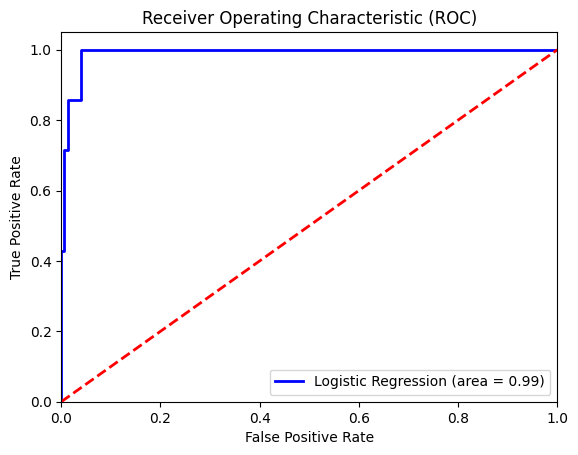

In [ ]:
from sklearn.metrics import roc_auc_score, roc_curve, confusion_matrix, precision_score, recall_score
from sklearn.metrics import classification_report, average_precision_score, accuracy_score, f1_score
y_pred = lrClassifier.predict(x_test_top_15)
y_proba = lrClassifier.predict_proba(x_test_top_15)[:,1]

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

# Printing the classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Calculating additional metrics
roc_auc = roc_auc_score(y_test, y_proba)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
average_precision = average_precision_score(y_test, y_proba)
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Printing additional metrics
print("\nROC AUC Score:", roc_auc)
print("Precision:", precision)
print("Recall:", recall)
print("Average Precision Score:", average_precision)
print("Accuracy:", accuracy)
print("F1 Score:", f1)

# Plotting the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_proba)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='Logistic Regression (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()


In [ ]:
import shap
explainer = shap.Explainer(lrClassifier.predict, x_train_top_15)
shap_values = explainer(x_train_top_15)

fig=plt.figure()
fig=shap.plots.beeswarm(shap_values, max_display=25,show=False)
plt.savefig("BeeSwarm1.png", dpi=700,bbox_inches = 'tight')
plt.show()

PermutationExplainer explainer:  13%|█▎        | 155/1228 [00:15<02:30,  7.14it/s]


KeyboardInterrupt: 

In [ ]:
fig=shap.summary_plot(shap_values, x_train_top_15, plot_type="bar",show=False)
plt.savefig("BarChartSHAP.png", dpi=100,bbox_inches = 'tight')
plt.show()

NameError: name 'shap_values' is not defined

In [ ]:
pip install eli5


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 kB 4.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107721 sha256=2b7ea6172c6938d1d1fc1f26150b213eb46dfa32009a99b5528dfcb3fb78f56d
  Stored in directory: /root/.cache/pip/wheels/b8/58/ef/2cf4c306898c2338d51540e0922c8e0d6028e07007085c0004
Successfully built eli5


In [ ]:


pip install scikit-learn==1.0.2


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.5/26.5 MB 38.1 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.5.2
    Uninstalling scikit-learn-1.5.2:
      Successfully uninstalled scikit-learn-1.5.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 1.18.0 requires scikit-learn>=1.2.2, but you have scikit-learn 1.0.2 which is incompatible.


In [ ]:
#ELI5
import eli5 as eli
eli.explain_weights(lrClassifier.best_estimator_)
eli.show_weights(rfclassifier.best_estimator_)
eli.show_prediction(rfclassifier.best_estimator_,x_test_top_15.iloc[1],
                    feature_names=list(x_train_top_15.columns),
                    show_feature_values=True)

NameError: name 'lrClassifier' is not defined

In [ ]:
!pip install Lime


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for Lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=237d42d7212e6ba53a755e8ea73079cd53eed317e4b617cf9f5923d0a4ddbc25
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built Lime


In [ ]:
import lime
from lime import lime_tabular

interpretor = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train_top_15),
    feature_names=x_train_top_15.columns,
    mode='classification'
)



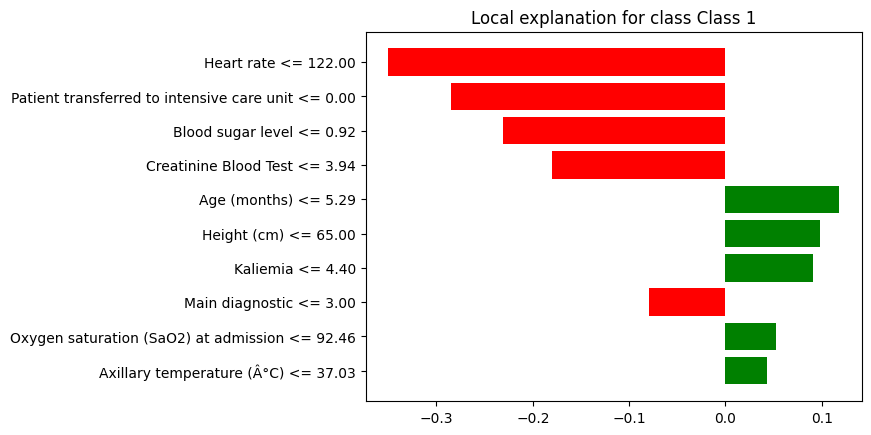

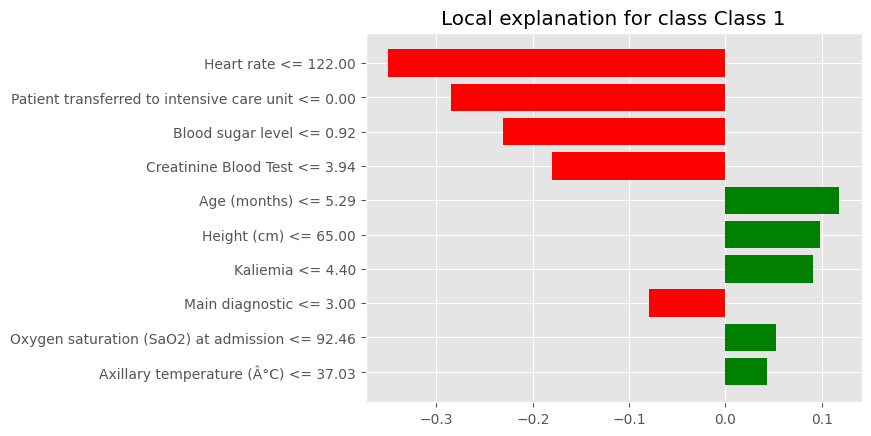

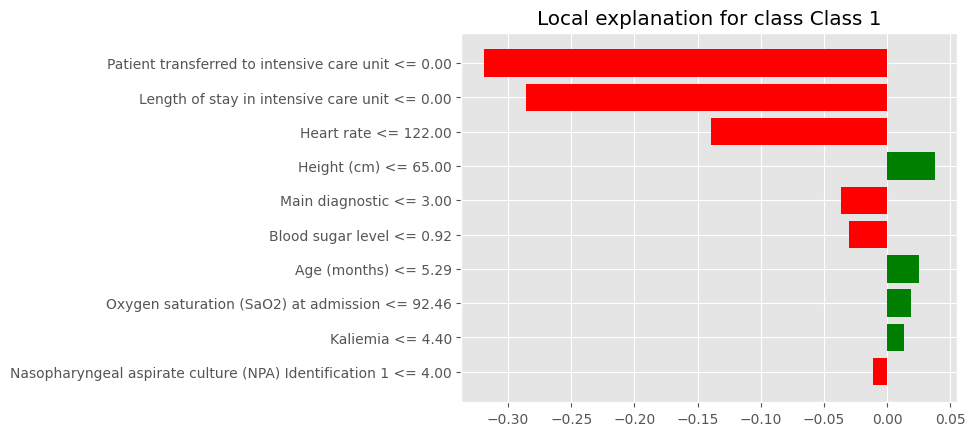

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from lime.lime_tabular import LimeTabularExplainer

# Ensure correct initialization of LimeTabularExplainer
interpretor = LimeTabularExplainer(
    training_data=np.array(x_train_top_15),
    feature_names=x_train_top_15.columns,
    class_names=['Class 0', 'Class 1'],  # Adjust based on your classifier's output
    mode='classification'
)

# Use the explain_instance function with the logistic regression model
exp = interpretor.explain_instance(
    data_row=x_test_top_15.iloc[12].values.reshape(-1),  # Ensure the correct shape
    predict_fn=lrClassifier.predict_proba
)

# Save the explanation as an HTML file
exp.save_to_file('LIME1.html')

# Generate and save the explanation as a matplotlib figure
fig = exp.as_pyplot_figure()
fig.savefig('lime_report.png')

# Display the explanation in the notebook
exp.show_in_notebook(show_table=True)

# Save the explanation figure with ggplot style
with plt.style.context("ggplot"):
    fig = exp.as_pyplot_figure()
    fig.savefig("LIME1.png", dpi=600, bbox_inches='tight')
    plt.show()

# Explain another instance with the random forest classifier
exp = interpretor.explain_instance(
    data_row=x_test_top_15.iloc[25].values.reshape(-1),  # Ensure correct shape
    predict_fn=rfclassifier.predict_proba
)

# Display the explanation in the notebook
exp.show_in_notebook(show_table=True)

# Save the explanation figure with ggplot style
with plt.style.context("ggplot"):
    fig = exp.as_pyplot_figure()
    fig.savefig("LIME2.png", dpi=600, bbox_inches='tight')
    plt.show()


In [ ]:
print(lrClassifier.predict_proba(x_test_top_15.iloc[12].values.reshape(1, -1)))


[[0.52813529 0.47186471]]


In [ ]:
exp = interpretor.explain_instance(
    data_row=x_test_top_15.iloc[12],  # New data point
    predict_fn=lrClassifier.predict_proba
)

TypeError: solve() got an unexpected keyword argument 'sym_pos'

In [ ]:
pip install scikit-learn


TypeError: solve() got an unexpected keyword argument 'sym_pos'

<?xml version="1.0" encoding="utf-8" ?>
<svg baseProfile="full" height="232.0" preserveAspectRatio="none" version="1.1" viewBox="0 0 651 232.0" width="651" xmlns="http://www.w3.org/2000/svg" xmlns:ev="http://www.w3.org/2001/xml-events" xmlns:xlink="http://www.w3.org/1999/xlink"><defs /><svg class="graph" height="155.0" width="471" x="0" y="0"><defs /><rect class="node" fill="#00F082" height="35" stroke="#1E1E1E" stroke-width="1" width="90" x="361" y="50.0"><title>Clinical_progression
logistic:
w=-1.0672
bias=-2.6673</title></rect><text fill="#1E1E1E" font-family="monospace" font-size="12" style="pointer-events:none" text-anchor="middle" x="406.0" y="71.5">Clinical..</text><text fill="#1E1E1E" font-family="monospace" font-size="10" style="pointer-events:none" text-anchor="end" x="449" y="59.0">0</text><text fill="#1E1E1E" font-family="monospace" font-size="10" style="pointer-events:none" text-anchor="start" x="363" y="59.0">logistic</text><line stroke="#1E1E1E" x1="331" x2="361" y1="67.5" y2="67.5" /><rect class="node" fill="#FAFAFA" height="35" stroke="#FF1EC8" stroke-width="1" width="90" x="241" y="50.0"><title>add</title></rect><text fill="#1E1E1E" font-family="monospace" font-size="12" style="pointer-events:none" text-anchor="middle" x="286.0" y="71.5">add</text><text fill="#1E1E1E" font-family="monospace" font-size="10" style="pointer-events:none" text-anchor="end" x="329" y="59.0">1</text><line stroke="#1E1E1E" x1="211" x2="241" y1="37.5" y2="58.5" /><line stroke="#1E1E1E" x1="211" x2="241" y1="97.5" y2="76.5" /><rect class="node" fill="#FAFAFA" height="35" stroke="#FF1EC8" stroke-width="1" width="90" x="121" y="20.0"><title>add</title></rect><text fill="#1E1E1E" font-family="monospace" font-size="12" style="pointer-events:none" text-anchor="middle" x="166.0" y="41.5">add</text><text fill="#1E1E1E" font-family="monospace" font-size="10" style="pointer-events:none" text-anchor="end" x="209" y="29.0">2</text><line stroke="#1E1E1E" x1="91" x2="121" y1="37.5" y2="28.5" /><line stroke="#1E1E1E" x1="91" x2="121" y1="97.5" y2="46.5" /><rect class="node" fill="#00F082" height="35" stroke="#1E1E1E" stroke-width="1" width="90" x="1" y="20.0"><title>Patient_transferred_to_intensive_care_unit
linear:
scale=2.000000
scale offset=0.081149
w=-1.826994
bias=-0.5437</title></rect><text fill="#1E1E1E" font-family="monospace" font-size="12" style="pointer-events:none" text-anchor="middle" x="46.0" y="41.5">Patient_..</text><text fill="#1E1E1E" font-family="monospace" font-size="10" style="pointer-events:none" text-anchor="end" x="89" y="29.0">3</text><text fill="#1E1E1E" font-family="monospace" font-size="10" style="pointer-events:none" text-anchor="start" x="3" y="29.0">num</text><rect class="node" fill="#00F082" height="35" stroke="#1E1E1E" stroke-width="1" width="90" x="1" y="80.0"><title>Weight_(Kg)
linear:
scale=0.094787
scale offset=11.052185
w=3.530446
bias=0.0418</title></rect><text fill="#1E1E1E" font-family="monospace" font-size="12" style="pointer-events:none" text-anchor="middle" x="46.0" y="101.5">Weight_(..</text><text fill="#1E1E1E" font-family="monospace" font-size="10" style="pointer-events:none" text-anchor="end" x="89" y="89.0">4</text><text fill="#1E1E1E" font-family="monospace" font-size="10" style="pointer-events:none" text-anchor="start" x="3" y="89.0">num</text><rect class="node" fill="#00F082" height="35" stroke="#1E1E1E" stroke-width="1" width="90" x="121" y="80.0"><title>Height_(cm)
linear:
scale=0.022727
scale offset=81.632834
w=-0.839012
bias=2.5579</title></rect><text fill="#1E1E1E" font-family="monospace" font-size="12" style="pointer-events:none" text-anchor="middle" x="166.0" y="101.5">Height_(..</text><text fill="#1E1E1E" font-family="monospace" font-size="10" style="pointer-events:none" text-anchor="end" x="209" y="89.0">5</text><text fill="#1E1E1E" font-family="monospace" font-size="10" style="pointer-events:none" text-anchor="start" x="123" y="89.0">num</text></svg><svg class="summary" height="79" width=
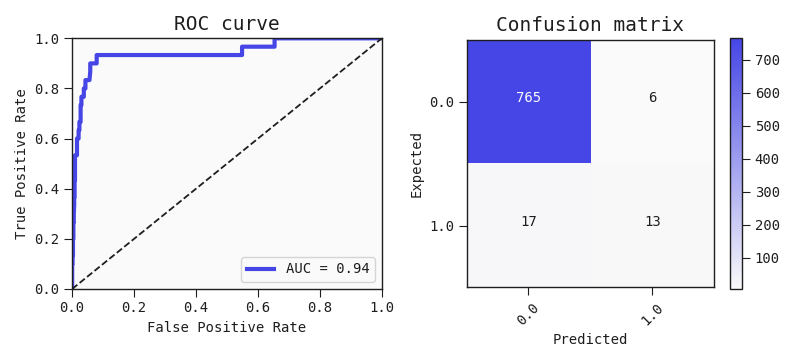

In [ ]:
import feyn

# Create a new QLattice instance
ql = feyn.QLattice(random_seed=42)




# Rename columns to remove colons and spaces
df.columns = [col.replace(':', '').replace(' ', '_') for col in df.columns]

# Run the auto_run function
fig = ql.auto_run(df, output_name="Clinical_progression", kind="classification", max_complexity=5)
# Select the best model
best_model = fig[0]
best_model1 = fig[1]
best_model2 = fig[2]
best_model3 = fig[3]

# Plot the best model to see the tree structure
best_model.plot(df)
best_model1.plot(df)
best_model2.plot(df)
best_model3.plot(df)

**DECISION TREE**

In [ ]:
#Decision Tree
param_grid = {
    'criterion' : ['gini', 'entropy'],
    'max_depth':[4,5,6,7,8,9,10,11,12,15,20,30,40,50,70,90,120,150],
    'min_samples_split' : range(10,500,20),
    'splitter' : ['best', 'random'],
    'min_samples_leaf': [1,5,8,11],
    'max_features': ['log2', 'sqrt','auto']
}

# Create a based model
dt = DecisionTreeClassifier()
# Instantiate the grid search model
dtClassifier = RandomizedSearchCV(estimator = dt, param_distributions = param_grid,
                          cv = 3, n_jobs = -1, verbose = 2)

dtClassifier.fit(x_train, y_train)
dtClassifier.best_params_

Fitting 3 folds for each of 10 candidates, totalling 30 fits


{'splitter': 'best',
 'min_samples_split': 70,
 'min_samples_leaf': 8,
 'max_features': 'log2',
 'max_depth': 12,
 'criterion': 'entropy'}

[[152   2]
 [  5   2]]
              precision    recall  f1-score   support

           0       0.97      0.99      0.98       154
           1       0.50      0.29      0.36         7

    accuracy                           0.96       161
   macro avg       0.73      0.64      0.67       161
weighted avg       0.95      0.96      0.95       161

hamming loss
0.043478260869565216
jaccord score
0.2222222222222222
log loss
1.5671153647442242
mathews correlation coefficient
0.35732066051328015


accuracy 0.96
precision 0.95
recall 0.96
f1-score 0.951
AUC: 0.81
Precision-Recall: 0.31
Confusion Matrix:
[[152   2]
 [  5   2]]

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.99      0.98       154
           1       0.50      0.29      0.36         7

    accuracy                           0.96       161
   macro avg       0.73      0.64      0.67       161
weighted avg       0.95      0.96      0.95       161


ROC AUC Score: 0.81

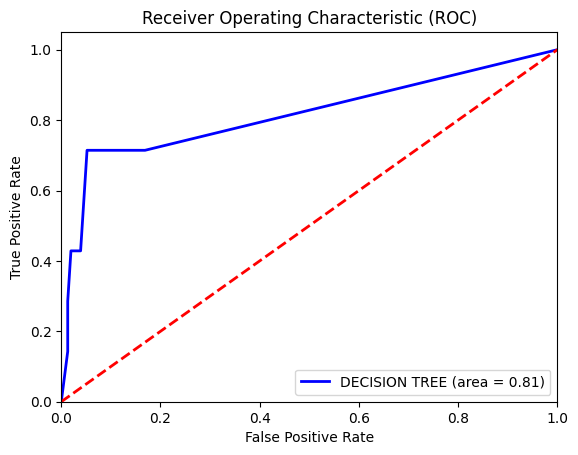

In [ ]:
y_pred = dtClassifier.predict(x_test)
y_proba = dtClassifier.predict_proba(x_test)[:,1]

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))


print("hamming loss")
print(hamming_loss(y_test, y_pred))
print("jaccord score")
print(jaccard_score(y_test, y_pred))
print("log loss")
print(log_loss(y_test,y_pred))
print("mathews correlation coefficient")
print(matthews_corrcoef(y_test, y_pred))

print('\n')
accuracy = round(accuracy_score(y_test, y_pred),2)
print("accuracy",accuracy)
precision = round(precision_score(y_test, y_pred, average='weighted'),2)
print("precision",precision)
recall = round(recall_score(y_test, y_pred, average='weighted'),2)
print("recall",recall)

f1 = round(f1_score(y_test, y_pred, average='weighted'),3)
print("f1-score",f1)

# precision_recall = round(average_precision_score(y_test, y_proba, average='weighted'),2)
auc = round(roc_auc_score(y_test, y_proba, average='weighted', multi_class='ovr'), 2)
print('AUC: {}'.format(round(roc_auc_score(y_test, y_proba),2)))
print('Precision-Recall: {}'.format(round(average_precision_score(y_test, y_proba),2)))



print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

# Printing the classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Calculating additional metrics
roc_auc = roc_auc_score(y_test, y_proba)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
average_precision = average_precision_score(y_test, y_proba)
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Printing additional metrics
print("\nROC AUC Score:", roc_auc)
print("Precision:", precision)
print("Recall:", recall)
print("Average Precision Score:", average_precision)
print("Accuracy:", accuracy)
print("F1 Score:", f1)

# Plotting the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_proba)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='DECISION TREE (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()


PermutationExplainer explainer: 1229it [01:42, 11.30it/s]                          


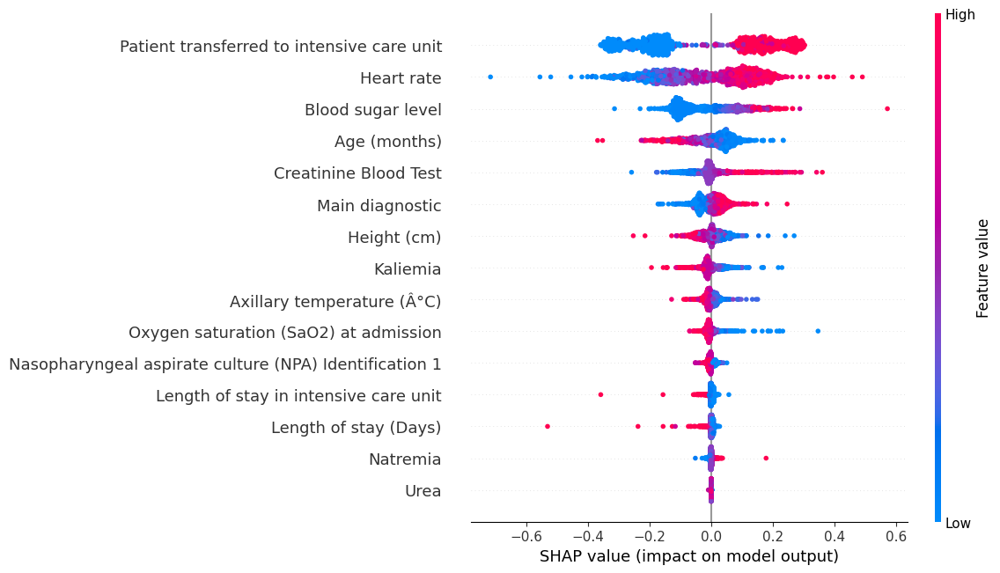

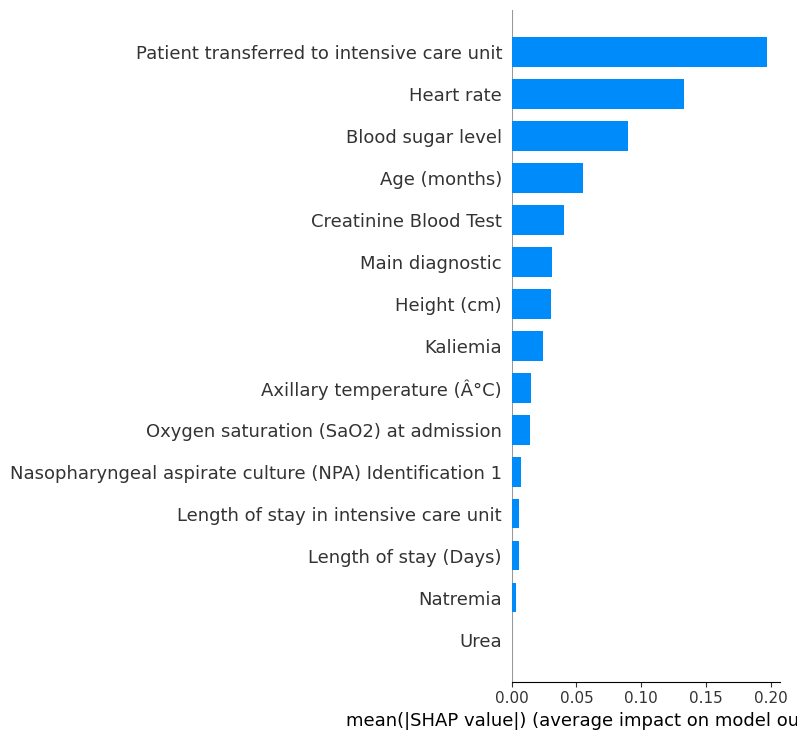

In [ ]:
import shap
explainer = shap.Explainer(lrClassifier.predict, x_train_top_15)
shap_values = explainer(x_train_top_15)

fig=plt.figure()
fig=shap.plots.beeswarm(shap_values, max_display=25,show=False)
plt.savefig("BeeSwarm1.png", dpi=700,bbox_inches = 'tight')
plt.show()
fig=shap.summary_plot(shap_values, x_train_top_15, plot_type="bar",show=False)
plt.savefig("BarChartSHAP.png", dpi=100,bbox_inches = 'tight')
plt.show()

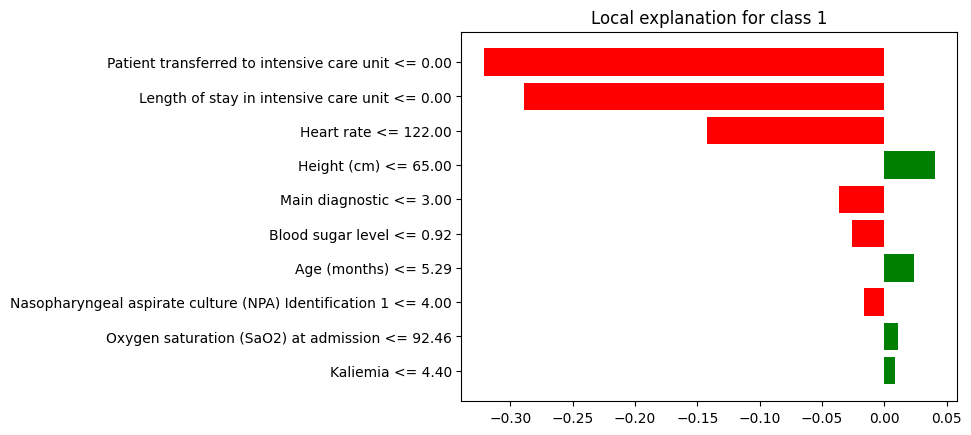

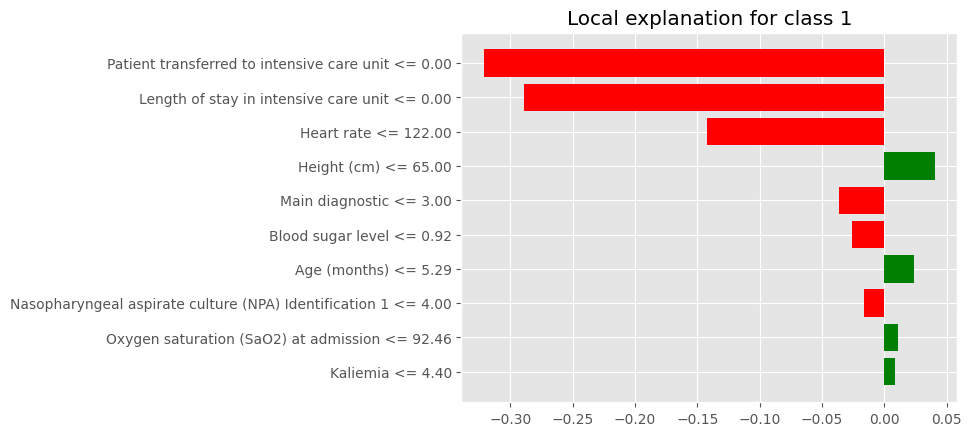

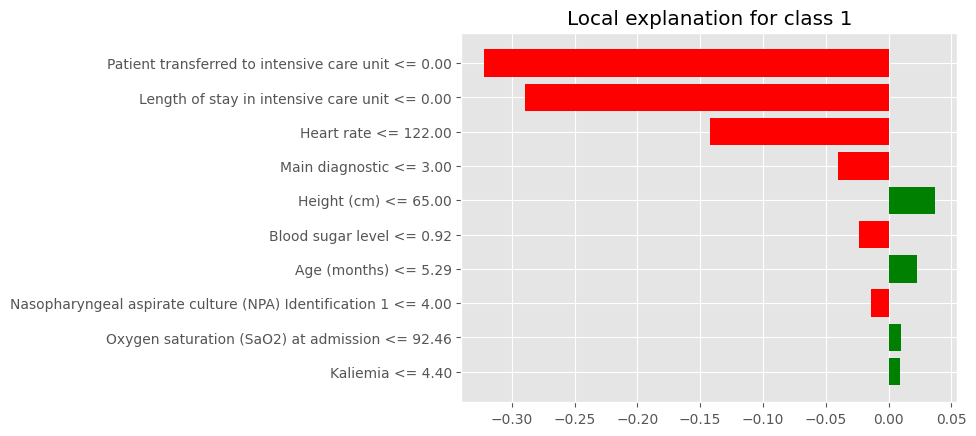

In [ ]:
import lime
from lime import lime_tabular

interpretor = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train_top_15),
    feature_names=x_train_top_15.columns,
    mode='classification'
)
exp = interpretor.explain_instance(
    data_row=x_test_top_15.iloc[12], ##new data
    predict_fn=rfclassifier.predict_proba
)
exp.save_to_file('LIME1.html')

fig = exp.as_pyplot_figure()
fig.savefig('lime_report.png')

fig=exp.show_in_notebook(show_table=True)
plt.savefig("LIMESurvived.png", dpi=100,bbox_inches = 'tight')
plt.show()
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()

    plt.savefig("LIME1.png", dpi=600,bbox_inches = 'tight')
exp = interpretor.explain_instance(
    data_row=x_test_top_15.iloc[25], ##new data
    predict_fn=rfclassifier.predict_proba
)

fig=exp.show_in_notebook(show_table=True)
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()
    plt.savefig("LIME2.png", dpi=600,bbox_inches = 'tight')

In [ ]:
import eli5 as eli
eli.explain_weights(dt.best_estimator_)
eli.show_weights(rfclassifier.best_estimator_)
eli.show_prediction(rfclassifier.best_estimator_,x_test_top_15.iloc[1],
                    feature_names=list(x_train_top_15.columns),
                    show_feature_values=True)

AttributeError: 'DecisionTreeClassifier' object has no attribute 'best_estimator_'

# KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import RandomizedSearchCV

# Instantiate the KNN classifier
knn = KNeighborsClassifier(algorithm='brute')

# Define the range of hyperparameters for n_neighbors
k_range = list(range(1, 100))
param_grid = dict(n_neighbors=k_range)

# Instantiate the randomized search model
knnClassifier = RandomizedSearchCV(estimator=knn, param_distributions=param_grid,
                                    cv=5, n_jobs=-1, verbose=2)

# Fit the model
knnClassifier.fit(x_train_top_15, y_train)

# Retrieve and print the best parameters
best_params = knnClassifier.best_params_
print("Best Parameters:", best_params)


Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best Parameters: {'n_neighbors': 41}


Confusion Matrix:
[[154   0]
 [  7   0]]

Classification Report:
              precision    recall  f1-score   support

           0       0.96      1.00      0.98       154
           1       0.00      0.00      0.00         7

    accuracy                           0.96       161
   macro avg       0.48      0.50      0.49       161
weighted avg       0.91      0.96      0.94       161


ROC AUC Score: 0.5
Precision: 0.0
Recall: 0.0
Average Precision Score: 0.043478260869565216
Accuracy: 0.9565217391304348
F1 Score: 0.0


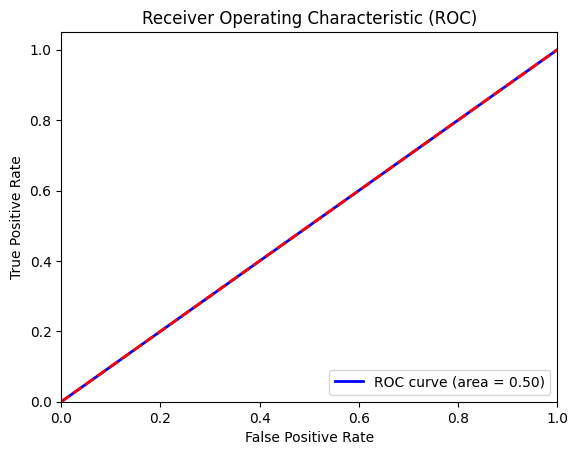

In [ ]:
# Make predictions and probabilities
y_pred = knnClassifier.predict(x_test_top_15)
y_proba = knnClassifier.predict_proba(x_test_top_15)[:, 1]

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

# Printing the classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Calculating additional metrics
roc_auc = roc_auc_score(y_test, y_proba)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
average_precision = average_precision_score(y_test, y_proba)
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Printing additional metrics
print("\nROC AUC Score:", roc_auc)
print("Precision:", precision)
print("Recall:", recall)
print("Average Precision Score:", average_precision)
print("Accuracy:", accuracy)
print("F1 Score:", f1)

# Plotting the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_proba)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

In [ ]:
import shap
explainer = shap.Explainer(knnClassifier.predict, x_train_top_15)
shap_values = explainer(x_train_top_15)

fig=plt.figure()
fig=shap.plots.beeswarm(shap_values, max_display=25,show=False)
plt.savefig("BeeSwarm1.png", dpi=700,bbox_inches = 'tight')
plt.show()
fig=shap.summary_plot(shap_values, x_train_top_15, plot_type="bar",show=False)
plt.savefig("BarChartSHAP.png", dpi=100,bbox_inches = 'tight')
plt.show()

PermutationExplainer explainer:  53%|█████▎    | 650/1228 [27:19<24:26,  2.54s/it]


KeyboardInterrupt: 

In [ ]:
import lime
from lime import lime_tabular

interpretor = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train_top_15),
    feature_names=x_train_top_15.columns,
    mode='classification'
)
exp = interpretor.explain_instance(
    data_row=x_test_top_15.iloc[12], ##new data
    predict_fn=knnClassifier.predict_proba
)
exp.save_to_file('LIME1.html')

fig = exp.as_pyplot_figure()
fig.savefig('lime_report.png')

fig=exp.show_in_notebook(show_table=True)
plt.savefig("LIMESurvived.png", dpi=100,bbox_inches = 'tight')
plt.show()
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()

    plt.savefig("LIME1.png", dpi=600,bbox_inches = 'tight')
exp = interpretor.explain_instance(
    data_row=x_test_top_15.iloc[25], ##new data
    predict_fn=rfclassifier.predict_proba
)

fig=exp.show_in_notebook(show_table=True)
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()
    plt.savefig("LIME2.png", dpi=600,bbox_inches = 'tight')

ADABOOST

In [ ]:
param_grid = {
    'n_estimators': [100, 200, 300, 1000],
    'learning_rate': [0.0001, 0.001, 0.01, 0.1, 1.0]
}

# Create a based model
ad = AdaBoostClassifier()
# Instantiate the grid search model
grid_searchAdaBoostClassifier = RandomizedSearchCV(estimator = ad, param_distributions = param_grid,
                          cv = 3, n_jobs = -1, verbose = 2)

grid_searchAdaBoostClassifier.fit(x_train, y_train)
grid_searchAdaBoostClassifier.best_params_

Fitting 3 folds for each of 10 candidates, totalling 30 fits


{'n_estimators': 200, 'learning_rate': 1.0}

Confusion Matrix:
[[153   1]
 [  3   4]]

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.99       154
           1       0.80      0.57      0.67         7

    accuracy                           0.98       161
   macro avg       0.89      0.78      0.83       161
weighted avg       0.97      0.98      0.97       161


ROC AUC Score: 0.9851576994434137
Precision: 0.8
Recall: 0.5714285714285714
Average Precision Score: 0.6619880119880119
Accuracy: 0.9751552795031055
F1 Score: 0.6666666666666666


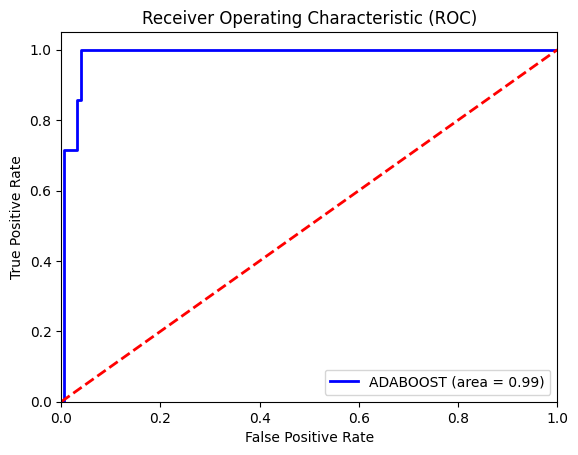

In [ ]:
y_pred = grid_searchAdaBoostClassifier.predict(x_test)
y_proba = grid_searchAdaBoostClassifier.predict_proba(x_test)[:,1]

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

# Printing the classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Calculating additional metrics
roc_auc = roc_auc_score(y_test, y_proba)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
average_precision = average_precision_score(y_test, y_proba)
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Printing additional metrics
print("\nROC AUC Score:", roc_auc)
print("Precision:", precision)
print("Recall:", recall)
print("Average Precision Score:", average_precision)
print("Accuracy:", accuracy)
print("F1 Score:", f1)

# Plotting the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_proba)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='ADABOOST (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

# CATBOOSTT

In [ ]:
!pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 8.1 MB/s eta 0:00:00


In [ ]:
from catboost import CatBoostClassifier

param_grid = {'depth':[3,1,2],
          'iterations':[250,100],
          'learning_rate':[0.03,0.001],
          'l2_leaf_reg':[3,1,5,10],
          'border_count':[32,5,10],

             }

# Create a based model
cd = CatBoostClassifier()
# Instantiate the grid search model
grid_searchCatBoostClassifier = RandomizedSearchCV(estimator = cd, param_distributions = param_grid,
                          cv = 3, n_jobs = -1, verbose = 2)

grid_searchCatBoostClassifier.fit(x_train, y_train)
grid_searchCatBoostClassifier.best_params_


Fitting 3 folds for each of 10 candidates, totalling 30 fits
0:	learn: 0.6413539	total: 51.7ms	remaining: 12.9s
1:	learn: 0.5929450	total: 56ms	remaining: 6.94s
2:	learn: 0.5496560	total: 58.1ms	remaining: 4.79s
3:	learn: 0.5161556	total: 63.3ms	remaining: 3.89s
4:	learn: 0.4800537	total: 69.4ms	remaining: 3.4s
5:	learn: 0.4489390	total: 77.8ms	remaining: 3.17s
6:	learn: 0.4225286	total: 80.2ms	remaining: 2.78s
7:	learn: 0.3903674	total: 83.1ms	remaining: 2.51s
8:	learn: 0.3684318	total: 86.8ms	remaining: 2.32s
9:	learn: 0.3442559	total: 92ms	remaining: 2.21s
10:	learn: 0.3253179	total: 104ms	remaining: 2.25s
11:	learn: 0.3046030	total: 115ms	remaining: 2.28s
12:	learn: 0.2890525	total: 120ms	remaining: 2.18s
13:	learn: 0.2751958	total: 132ms	remaining: 2.22s
14:	learn: 0.2593181	total: 147ms	remaining: 2.3s
15:	learn: 0.2462801	total: 170ms	remaining: 2.48s
16:	learn: 0.2306512	total: 176ms	remaining: 2.42s
17:	learn: 0.2193081	total: 184ms	remaining: 2.37s
18:	learn: 0.2085770	total:

{'learning_rate': 0.03,
 'l2_leaf_reg': 10,
 'iterations': 250,
 'depth': 2,
 'border_count': 32}

Confusion Matrix:
[[153   1]
 [  3   4]]

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.99       154
           1       0.80      0.57      0.67         7

    accuracy                           0.98       161
   macro avg       0.89      0.78      0.83       161
weighted avg       0.97      0.98      0.97       161


ROC AUC Score: 0.9897959183673469
Precision: 0.8
Recall: 0.5714285714285714
Average Precision Score: 0.7779434850863423
Accuracy: 0.9751552795031055
F1 Score: 0.6666666666666666


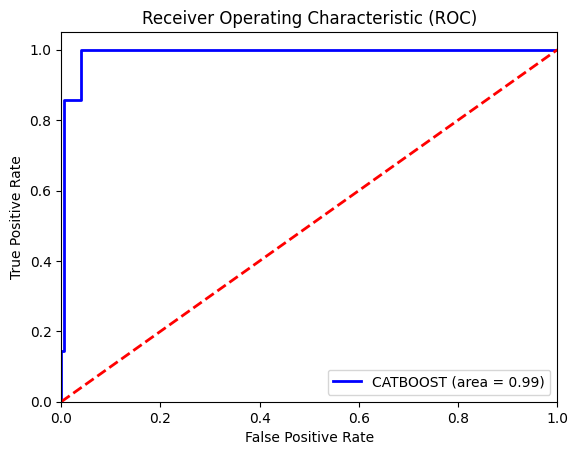

In [ ]:
y_pred = grid_searchCatBoostClassifier.predict(x_test)
y_proba = grid_searchCatBoostClassifier.predict_proba(x_test)[:,1]


print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

# Printing the classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Calculating additional metrics
roc_auc = roc_auc_score(y_test, y_proba)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
average_precision = average_precision_score(y_test, y_proba)
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Printing additional metrics
print("\nROC AUC Score:", roc_auc)
print("Precision:", precision)
print("Recall:", recall)
print("Average Precision Score:", average_precision)
print("Accuracy:", accuracy)
print("F1 Score:", f1)

# Plotting the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_proba)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='CATBOOST (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()


# lightgbm

In [ ]:
from lightgbm import LGBMClassifier

param_grid = {
     'num_leaves': [31, 127],
    'reg_alpha': [0.1, 0.5],
    'min_data_in_leaf': [30, 50, 100, 300, 400],
    'lambda_l1': [0, 1, 1.5],
    'lambda_l2': [0, 1]


             }

# Create a based model
lg =  LGBMClassifier()
# Instantiate the grid search model
lgm = RandomizedSearchCV(estimator = lg, param_distributions = param_grid,
                          cv = 3, n_jobs = -1, verbose = 2)

lgm.fit(x_train, y_train)
lgm.best_params_

Fitting 3 folds for each of 10 candidates, totalling 30 fits


ValueError: 
All the 30 fits failed.
It is very likely that your model is misconfigured.
You can try to debug the error by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
30 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py", line 1142, in fit
    super().fit(
  File "/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py", line 842, in fit
    self._Booster = train(
  File "/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py", line 255, in train
    booster = Booster(params=params, train_set=train_set)
  File "/usr/local/lib/python3.10/dist-packages/lightgbm/basic.py", line 3200, in __init__
    train_set.construct()
  File "/usr/local/lib/python3.10/dist-packages/lightgbm/basic.py", line 2276, in construct
    self._lazy_init(data=self.data, label=self.label, reference=None,
  File "/usr/local/lib/python3.10/dist-packages/lightgbm/basic.py", line 1959, in _lazy_init
    return self.set_feature_name(feature_name)
  File "/usr/local/lib/python3.10/dist-packages/lightgbm/basic.py", line 2639, in set_feature_name
    _safe_call(_LIB.LGBM_DatasetSetFeatureNames(
  File "/usr/local/lib/python3.10/dist-packages/lightgbm/basic.py", line 242, in _safe_call
    raise LightGBMError(_LIB.LGBM_GetLastError().decode('utf-8'))
lightgbm.basic.LightGBMError: Do not support special JSON characters in feature name.


In [ ]:
y_pred = lgm.predict(x_test)
y_proba = lgm.predict_proba(x_test)[:,1]

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))


print("hamming loss")
print(hamming_loss(y_test, y_pred))
print("jaccord score")
print(jaccard_score(y_test, y_pred))
print("log loss")
print(log_loss(y_test,y_pred))
print("mathews correlation coefficient")
print(matthews_corrcoef(y_test, y_pred))

# ExtratreeClassifier summary
print('\n')
accuracy = round(accuracy_score(y_test, y_pred),2)
print("accuracy",accuracy)
precision = round(precision_score(y_test, y_pred),2)
print("precision",precision)
recall = round(recall_score(y_test, y_pred),2)
print("recall",recall)
precision_recall = round(average_precision_score(y_test, y_proba),2)
auc = round(roc_auc_score(y_test, y_proba),2)
print('AUC: {}'.format(round(roc_auc_score(y_test, y_proba),2)))
print('Precision-Recall: {}'.format(round(average_precision_score(y_test, y_proba),2)))

fpr, tpr, _ = roc_curve(y_test,  y_pred)
auc = round(roc_auc_score(y_test, y_proba),2)


fig = plt.figure()

# Set titles for the figure and the subplot respectively
fig.suptitle('(e)', fontsize=14, fontweight='bold')
ax = plt.axes()
ax.set_facecolor('beige')

plt.plot(fpr,tpr,color='xkcd:black',label='Lightgbm  AUC: '+str(auc))
plt.legend(loc=4)
plt.grid(True)
plt.plot([0, 1], [0, 1], color='blue', linestyle='-.')
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.savefig("AUC Lightgbm", dpi=800,bbox_inches = 'tight')

plt.show()




#Precsiion Recall Curve
from sklearn.metrics import plot_precision_recall_curve
plot_precision_recall_curve(lgm, x_test, y_test,color='xkcd:black', name = 'Lightgbm')



plt.grid(True)
plt.plot([0, 1], [0, 1], color='blue', linestyle='-.')
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.legend(loc=4)
plt.grid(True)

plt.savefig("PR curve Lightgbm", dpi=800,bbox_inches = 'tight')


#Confusion Matrix
 #print confusion matrix
cm=confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10,6))
sns.heatmap(cm,annot=True,fmt="d")
sns.heatmap
plt.xlabel('Actual values')
plt.ylabel('Predicted values')
plt.savefig("Confusion Matix Lightgbm", dpi=800,bbox_inches = 'tight')


# XGBOST
**bold text**

In [ ]:
from xgboost import XGBClassifier

param_grid = {
    "learning_rate": (0.05, 0.10, 0.15),
                        "max_depth": [ 3, 4, 5, 6, 8],
                        "min_child_weight": [ 1, 3, 5, 7],
                        "gamma":[ 0.0, 0.1, 0.2],
                        "colsample_bytree":[ 0.3, 0.4],


             }

# Create a based model
lg = XGBClassifier()
# Instantiate the grid search model
xgb = RandomizedSearchCV(estimator = lg, param_distributions = param_grid,
                          cv = 3, n_jobs = -1, verbose = 2)

xgb.fit(x_train, y_train)
xgb.best_params_

Fitting 3 folds for each of 10 candidates, totalling 30 fits


{'min_child_weight': 1,
 'max_depth': 3,
 'learning_rate': 0.15,
 'gamma': 0.0,
 'colsample_bytree': 0.3}

[[153   1]
 [  6   1]]
              precision    recall  f1-score   support

           0       0.96      0.99      0.98       154
           1       0.50      0.14      0.22         7

    accuracy                           0.96       161
   macro avg       0.73      0.57      0.60       161
weighted avg       0.94      0.96      0.94       161

hamming loss
0.043478260869565216
jaccord score
0.125
log loss
1.5671153647442242
mathews correlation coefficient
0.2510697524258754
accuracy 0.96
precision 0.94
recall 0.96
f1-score 0.945
AUC: 0.99
Precision-Recall: 0.83


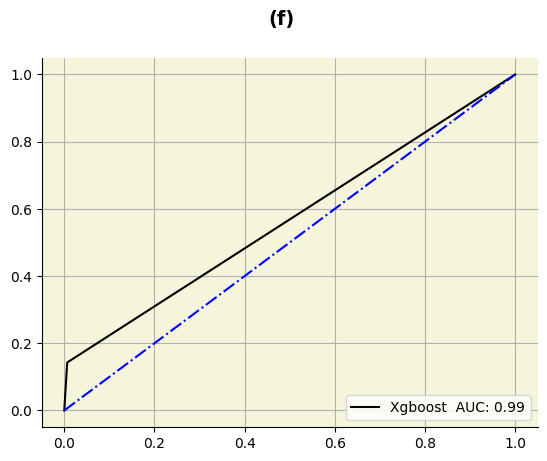

Confusion Matrix:
[[153   1]
 [  6   1]]

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.99      0.98       154
           1       0.50      0.14      0.22         7

    accuracy                           0.96       161
   macro avg       0.73      0.57      0.60       161
weighted avg       0.94      0.96      0.94       161


ROC AUC Score: 0.9944341372912802
Precision: 0.5
Recall: 0.14285714285714285
Average Precision Score: 0.8260204081632654
Accuracy: 0.9565217391304348
F1 Score: 0.2222222222222222


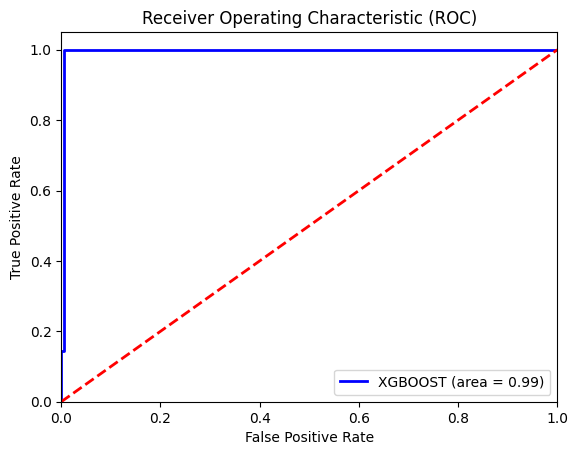

In [ ]:
y_pred = xgb.predict(x_test)
y_proba = xgb.predict_proba(x_test)[:,1]

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))


print("hamming loss")
print(hamming_loss(y_test, y_pred))
print("jaccord score")
print(jaccard_score(y_test, y_pred))
print("log loss")
print(log_loss(y_test,y_pred))
print("mathews correlation coefficient")
print(matthews_corrcoef(y_test, y_pred))

# ExtratreeClassifier summary
accuracy = round(accuracy_score(y_test, y_pred),2)
print("accuracy",accuracy)
precision = round(precision_score(y_test, y_pred, average='weighted'),2)
print("precision",precision)
recall = round(recall_score(y_test, y_pred, average='weighted'),2)
print("recall",recall)

f1 = round(f1_score(y_test, y_pred, average='weighted'),3)
print("f1-score",f1)

# precision_recall = round(average_precision_score(y_test, y_proba, average='weighted'),2)
auc = round(roc_auc_score(y_test, y_proba, average='weighted', multi_class='ovr'), 2)
print('AUC: {}'.format(round(roc_auc_score(y_test, y_proba),2)))
print('Precision-Recall: {}'.format(round(average_precision_score(y_test, y_proba),2)))

fpr, tpr, _ = roc_curve(y_test,  y_pred)
auc = round(roc_auc_score(y_test, y_proba),2)


fig = plt.figure()

# Set titles for the figure and the subplot respectively
fig.suptitle('(f)', fontsize=14, fontweight='bold')
ax = plt.axes()
ax.set_facecolor('beige')

plt.plot(fpr,tpr,color='xkcd:black',label='Xgboost  AUC: '+str(auc))
plt.legend(loc=4)
plt.grid(True)
plt.plot([0, 1], [0, 1], color='blue', linestyle='-.')
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.savefig("AUC Xgboost", dpi=800,bbox_inches = 'tight')

plt.show()


print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

# Printing the classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Calculating additional metrics
roc_auc = roc_auc_score(y_test, y_proba)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
average_precision = average_precision_score(y_test, y_proba)
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Printing additional metrics
print("\nROC AUC Score:", roc_auc)
print("Precision:", precision)
print("Recall:", recall)
print("Average Precision Score:", average_precision)
print("Accuracy:", accuracy)
print("F1 Score:", f1)

# Plotting the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_proba)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='XGBOOST (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()


#STACKING


In [ ]:
#Stacking
# Three models
from mlxtend.classifier import StackingClassifier
clf1 = rfclassifier
clf2 = lrClassifier
clf3 = grid_searchCatBoostClassifier
clf5= xgb
clf8 = knnClassifier




# meta-classifier
meta_clf = LogisticRegression(random_state=42,max_iter=9000)

# Stacking
stack = StackingClassifier(classifiers=[clf1, clf2, clf3,clf5,clf8],
                           use_probas=True,
                           average_probas=False,
                          meta_classifier=meta_clf)

In [ ]:
stack.fit(x_train, y_train)

Fitting 3 folds for each of 7 candidates, totalling 21 fits
Fitting 3 folds for each of 10 candidates, totalling 30 fits
0:	learn: 0.6403798	total: 1.81ms	remaining: 179ms
1:	learn: 0.5912930	total: 3.01ms	remaining: 147ms
2:	learn: 0.5469826	total: 4.51ms	remaining: 146ms
3:	learn: 0.5056482	total: 5.76ms	remaining: 138ms
4:	learn: 0.4690578	total: 6.85ms	remaining: 130ms
5:	learn: 0.4351418	total: 7.88ms	remaining: 124ms
6:	learn: 0.4151047	total: 9.09ms	remaining: 121ms
7:	learn: 0.3878137	total: 10.6ms	remaining: 122ms
8:	learn: 0.3624620	total: 11.8ms	remaining: 119ms
9:	learn: 0.3404354	total: 13.1ms	remaining: 118ms
10:	learn: 0.3198103	total: 14.5ms	remaining: 117ms
11:	learn: 0.3021735	total: 15.7ms	remaining: 115ms
12:	learn: 0.2840294	total: 18ms	remaining: 120ms
13:	learn: 0.2699319	total: 19.6ms	remaining: 121ms
14:	learn: 0.2552883	total: 20.9ms	remaining: 118ms
15:	learn: 0.2436606	total: 22.6ms	remaining: 119ms
16:	learn: 0.2320457	total: 23.9ms	remaining: 117ms
17:	lea

StackingClassifier(classifiers=[RandomizedSearchCV(cv=5,
                                                   estimator=RandomForestClassifier(),
                                                   n_jobs=-1,
                                                   param_distributions={'bootstrap': [True],
                                                                        'max_depth': [80,
                                                                                      90,
                                                                                      100,
                                                                                      110],
                                                                        'max_features': [2,
                                                                                         3],
                                                                        'min_samples_leaf': [3,
                                                                                             4,
                                                                                             5],
                                                                        'min_samples_split': [8,
                                                                                              10,
                                                                                              12],
                                                                        'n_estimators': [100,
                                                                                         200,
                                                                                         300,
                                                                                         1000]},
                                                   random_state=42),
                                RandomizedSearchCV(cv=3,
                                                   estimator=LogisticRegressio...
                                                                                      4,
                                                                                      5,
                                                                                      6,
                                                                                      8],
                                                                        'min_child_weight': [1,
                                                                                             3,
                                                                                             5,
                                                                                             7]},
                                                   verbose=2),
                                RandomizedSearchCV(cv=3,
                                                   estimator=KNeighborsClassifier(algorithm='brute'),
                                                   n_jobs=-1,
                                                   param_distributions={'n_neighbors': [1,
                                                                                        2,
                                                                                        3,
                                                                                        4,
                                                                                        5,
                                                                                        6,
                                                                                        7,
                                                                                        8,
                                                                                        9,
                                                                                        10,
                                             

[[155   1]
 [  3   2]]
              precision    recall  f1-score   support

           0       0.98      0.99      0.99       156
           1       0.67      0.40      0.50         5

    accuracy                           0.98       161
   macro avg       0.82      0.70      0.74       161
weighted avg       0.97      0.98      0.97       161

hamming loss
0.024844720496894408
jaccord score
0.3333333333333333
log loss
0.8954944941395568
mathews correlation coefficient
0.5048959689021197
accuracy 0.98
precision 0.97
recall 0.98
f1-score 0.972
AUC: 0.93
Precision-Recall: 0.55


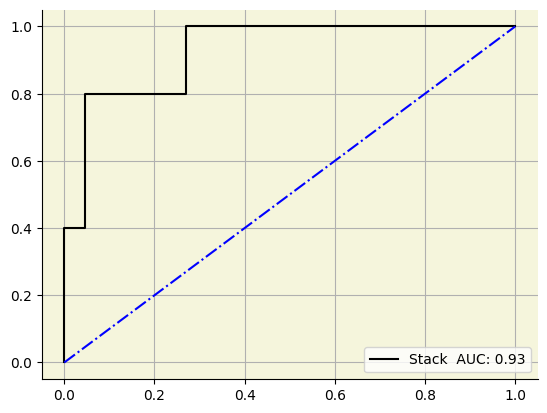

In [ ]:
y_pred = stack.predict(x_test)
y_proba = stack.predict_proba(x_test)[:,1]

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))


print("hamming loss")
print(hamming_loss(y_test, y_pred))
print("jaccord score")
print(jaccard_score(y_test, y_pred))
print("log loss")
print(log_loss(y_test,y_pred))
print("mathews correlation coefficient")
print(matthews_corrcoef(y_test, y_pred))

# StackingClassifier summary
accuracy = round(accuracy_score(y_test, y_pred),2)
print("accuracy",accuracy)
precision = round(precision_score(y_test, y_pred, average='weighted'),2)
print("precision",precision)
recall = round(recall_score(y_test, y_pred, average='weighted'),2)
print("recall",recall)

f1 = round(f1_score(y_test, y_pred, average='weighted'),3)
print("f1-score",f1)

# precision_recall = round(average_precision_score(y_test, y_proba, average='weighted'),2)
auc = round(roc_auc_score(y_test, y_proba, average='weighted', multi_class='ovr'), 2)
print('AUC: {}'.format(round(roc_auc_score(y_test, y_proba),2)))
print('Precision-Recall: {}'.format(round(average_precision_score(y_test, y_proba),2)))


fpr, tpr, _ = roc_curve(y_test,  y_proba)
auc = round(roc_auc_score(y_test, y_proba),2)


fig = plt.figure()

# Set titles for the figure and the subplot respectively
#fig.suptitle('(h)', fontsize=14, fontweight='bold')
ax = plt.axes()
ax.set_facecolor('beige')

plt.plot(fpr,tpr,color='xkcd:black',label='Stack  AUC: '+str(auc))
plt.legend(loc=4)
plt.grid(True)
plt.plot([0, 1], [0, 1], color='blue', linestyle='-.')
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.savefig("AUC Stack", dpi=800,bbox_inches = 'tight')

plt.show()


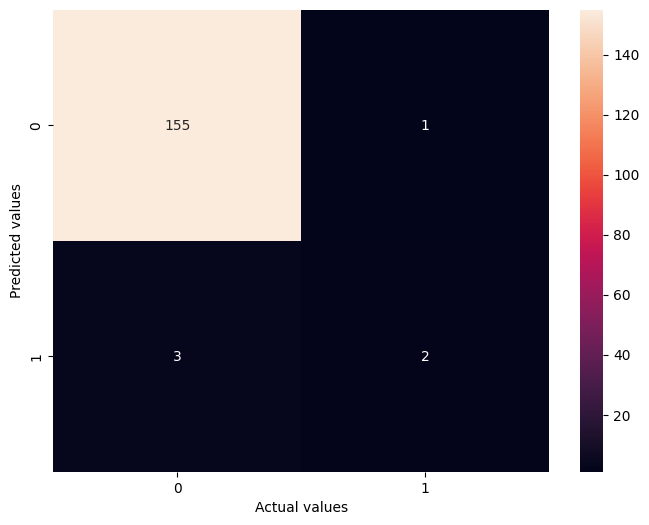

In [ ]:
#Confusion Matrix
 #print confusion matrix
cm=confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8,6))
sns.heatmap(cm,annot=True,fmt="d")
sns.heatmap
plt.xlabel('Actual values')
plt.ylabel('Predicted values')
plt.savefig("Confusion matrix StackB", dpi=800,bbox_inches = 'tight')

In [ ]:
from sklearn.metrics import precision_recall_curve
precision,recall,thresholds=precision_recall_curve(y_test,y_proba)
fig, ax=plt.subplots()
ax.plot(recall,precision,color='blue')
ax.set_ylabel('Precision')
ax.set_xlabel('Recall')
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.grid(True)
plt.savefig("PR Final", dpi=800,bbox_inches = 'tight')
plt.show()